<a href="https://colab.research.google.com/github/rahmanziaur/TestGraphTheory/blob/main/3_Pagerank_and_RiskScore.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import networkx as nx
import numpy as np

df_sc = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/edge.csv')
g_sc = nx.from_pandas_edgelist(df_sc, source='Source', target='Target', edge_attr =None, create_using=nx.DiGraph())
r_g_sc = nx.reverse(g_sc)

#df_pr_risk = pd.read_csv("https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv")
#

#df_pr_risk = pd.read_csv('t8.csv')

df_pr_risk = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/rahman/master/final-risk-score-rub.csv')

in_reach = pd.Series([])

#reachability

for k in df_pr_risk['Id']:
    in_reach[k] = len(nx.shortest_path(g_sc, k).keys())

df_pr_risk.insert(len(df_pr_risk.columns), 'In_reach', in_reach)

#reachable_node_list

list_of_reach_node_list = [[] for _ in range(len(df_pr_risk['Id']))]

for k in df_pr_risk['Id']:
  for reach_nodes in nx.shortest_path(g_sc, k).keys():
    list_of_reach_node_list[k].append(reach_nodes)

#Agg_RS

score = pd.Series([])
score20 = pd.Series([])
score30 = pd.Series([])
score50 = pd.Series([])
score70 = pd.Series([])

for row in list_of_reach_node_list:
  sum=0
  sum20 = 0
  sum30 = 0
  sum50 = 0
  sum70 = 0

  for node_id in row:
    if np.isnan(df_pr_risk['FinalRiskScore'][node_id]):
      continue

    sum = sum + df_pr_risk['FinalRiskScore'][node_id]

    if df_pr_risk['FinalRiskScore'][node_id] >= 0.20:
      sum20 = sum20 + df_pr_risk['FinalRiskScore'][node_id]

    if df_pr_risk['FinalRiskScore'][node_id] >= 0.30:
      sum30 = sum30 + df_pr_risk['FinalRiskScore'][node_id]

    if df_pr_risk['FinalRiskScore'][node_id] >= 0.50:
      sum50 = sum50 + df_pr_risk['FinalRiskScore'][node_id]

    if df_pr_risk['FinalRiskScore'][node_id] >= 0.70:
      sum70 = sum70 + df_pr_risk['FinalRiskScore'][node_id]


  score[row[0]] = sum
  score20[row[0]] = sum20
  score30[row[0]] = sum30
  score50[row[0]] = sum50
  score70[row[0]] = sum70

df_pr_risk.insert(len(df_pr_risk.columns),'Agg_RS)', score)
df_pr_risk.insert(len(df_pr_risk.columns),'Agg_RS20)', score20)
df_pr_risk.insert(len(df_pr_risk.columns),'Agg_RS30)', score30)
df_pr_risk.insert(len(df_pr_risk.columns),'Agg_RS50)', score50)
df_pr_risk.insert(len(df_pr_risk.columns),'Agg_RS70)', score70)
df_pr_risk.to_csv('Agg_RS_full_2.csv')


<ipython-input-2-248444a470a4>:16: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  in_reach = pd.Series([])
<ipython-input-2-248444a470a4>:35: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  score = pd.Series([])
<ipython-input-2-248444a470a4>:36: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  score20 = pd.Series([])
<ipython-input-2-248444a470a4>:37: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  score30 = pd.Series([])
<ipython-input-2-248444a470a4>:38: FutureWarning: The default dtype for empty Series will be 'object' instead of 

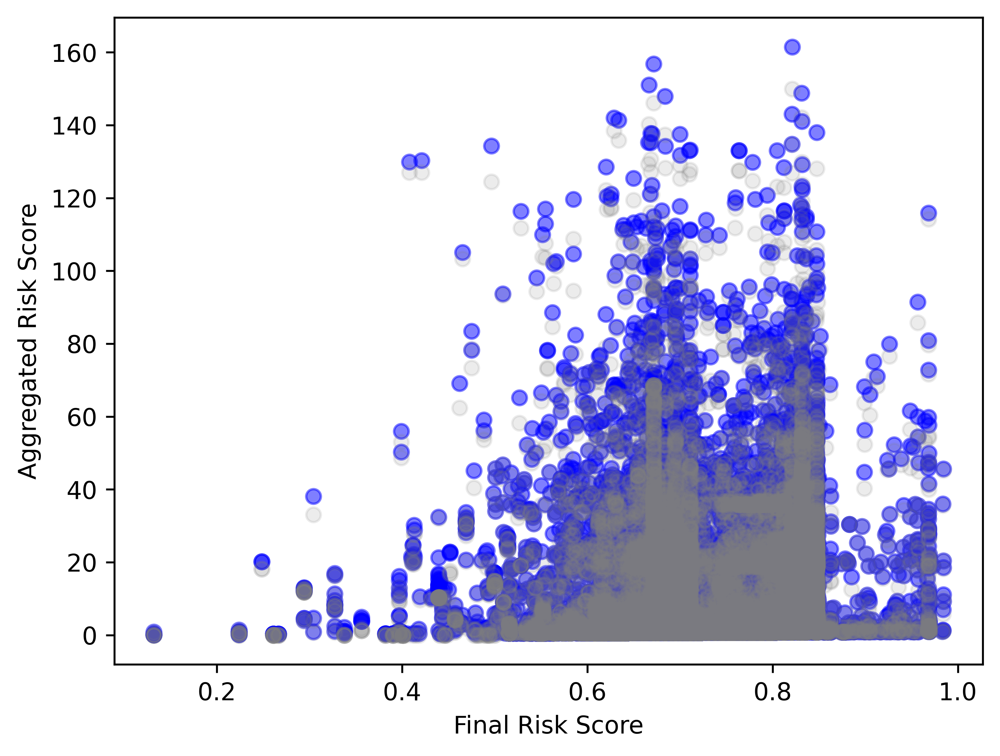

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')

#df1['Cat'] = np.where(df1['FinalRiskScore'] > 0.5,'red', 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3


plt.scatter(df1['FinalRiskScore'], df1['Agg_RS)'], c='blue', alpha=0.5)
plt.scatter(df1['FinalRiskScore'], df1['Agg_RS50)'], c='grey', alpha=0.15)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('Final Risk Score')
plt.ylabel('Aggregated Risk Score')

plt.savefig('score-vs-ag_score-0.png')
plt.show()

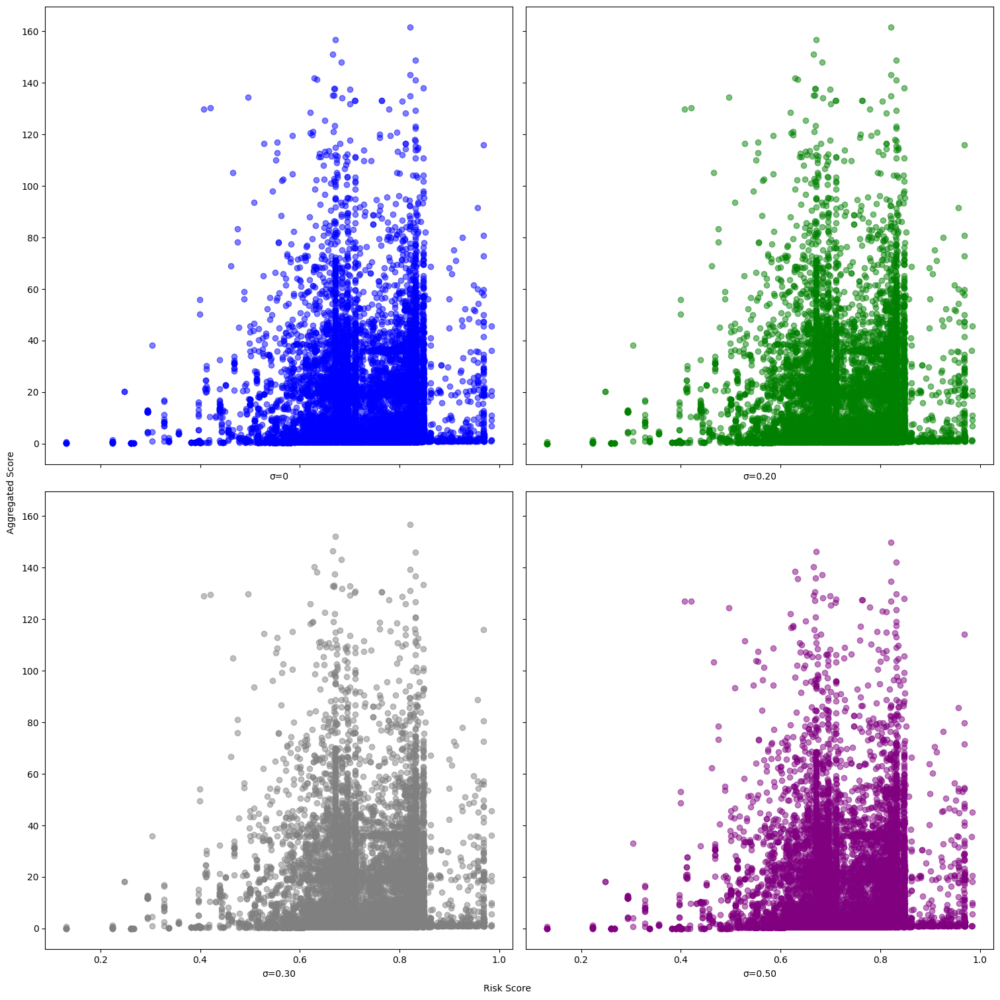

In [ ]:
import matplotlib.pyplot as plt
import numpy
import random
import warnings

df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')

#,Agg_RS20),Agg_RS30),Agg_RS50)

x = df1['FinalRiskScore']
y_a_rs = df1['Agg_RS)']
y_a_rs20 = df1['Agg_RS20)']
y_a_rs30 = df1['Agg_RS30)']
y_a_rs50 = df1['Agg_RS50)']


f, axes = plt.subplots(nrows = 2, ncols = 2,  figsize=(15, 15), sharex=True, sharey = True)

axes[0][0].scatter(x,y_a_rs,c='blue', marker = "o", alpha=0.5)
axes[0][0].set_xlabel('\u03C3=0', labelpad = 5)

axes[0][1].scatter(x,y_a_rs20,c='green', marker = "o", alpha=0.5)
axes[0][1].set_xlabel('\u03C3=0.20', labelpad = 5)

axes[1][0].scatter(x,y_a_rs30,c='grey', marker = "o", alpha=0.5)
axes[1][0].set_xlabel('\u03C3=0.30', labelpad = 5)

axes[1][1].scatter(x,y_a_rs50,c='purple', marker = "o", alpha=0.5)
axes[1][1].set_xlabel('\u03C3=0.50', labelpad = 5)

f.text(0.5, 0, 'Risk Score', ha='center', va='center')
f.text(0, 0.5, 'Aggregated Score', ha='center', va='center', rotation='vertical')

plt.tight_layout()
plt.savefig('CompareScatter1.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()

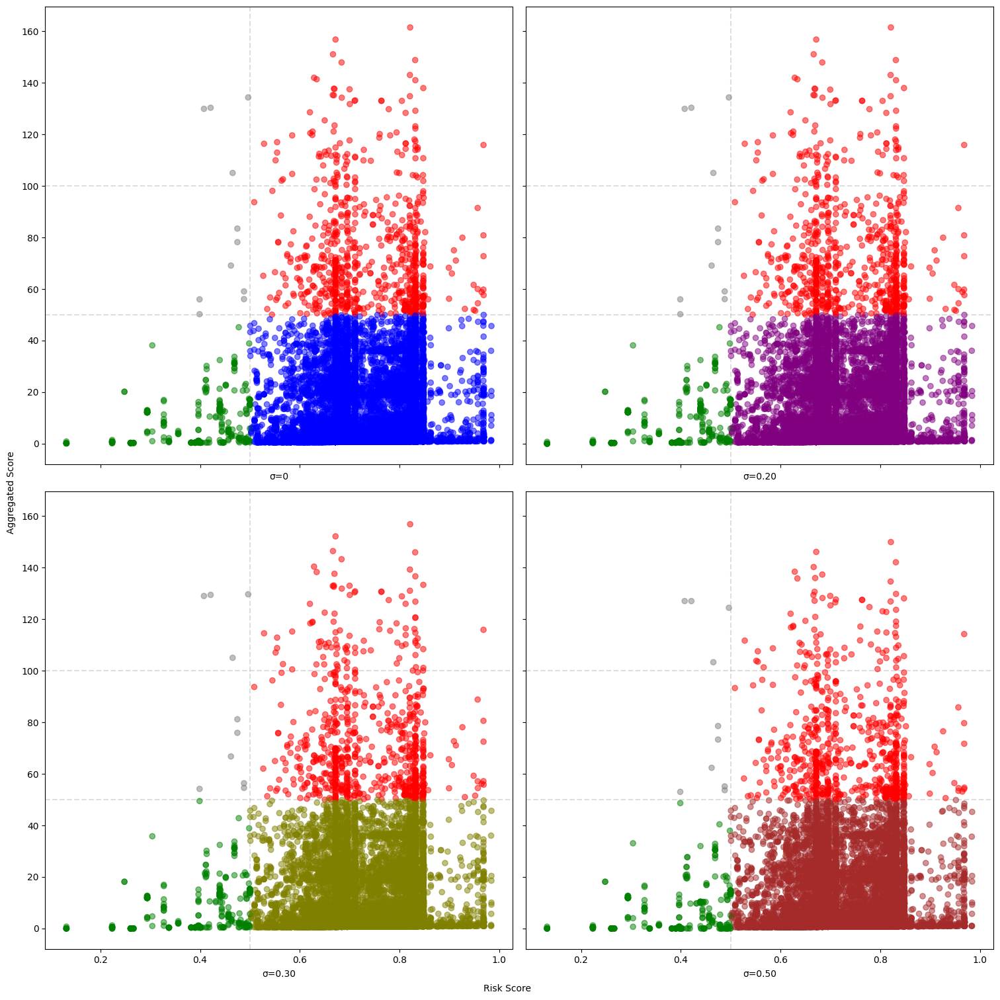

In [ ]:
import matplotlib.pyplot as plt
import numpy
import random
import warnings

df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')

#,Agg_RS20),Agg_RS30),Agg_RS50)

x = df1['FinalRiskScore']
y_a_rs = df1['Agg_RS)']
y_a_rs20 = df1['Agg_RS20)']
y_a_rs30 = df1['Agg_RS30)']
y_a_rs50 = df1['Agg_RS50)']


col1 = 'FinalRiskScore'
col2 = 'Agg_RS)'
col3 = 'Agg_RS20)'
col4 = 'Agg_RS30)'
col5 = 'Agg_RS50)'

GREY50 = "#7F7F7F"

df1['Cat0'] = np.where(df1[col1] >=.5, (np.where(df1[col2] >= 50, 'red', 'blue')), (np.where(df1[col2] >= 50, GREY50, 'green')))
df1['Cat20'] = np.where(df1[col1] >=.5, (np.where(df1[col3] >= 50, 'red', 'purple')), (np.where(df1[col3] >= 50, GREY50, 'green')))
df1['Cat30'] = np.where(df1[col1] >=.5, (np.where(df1[col4] >= 50, 'red', 'olive')), (np.where(df1[col4] >= 50, GREY50, 'green')))
df1['Cat50'] = np.where(df1[col1] >=.5, (np.where(df1[col5] >= 50, 'red', 'brown')), (np.where(df1[col5] >= 50, GREY50, 'green')))

f, axes = plt.subplots(nrows = 2, ncols = 2,  figsize=(15, 15), sharex=True, sharey = True)

axes[0][0].scatter(x,y_a_rs,c=df1['Cat0'], marker = "o", alpha=0.5)
axes[0][0].set_xlabel('\u03C3=0', labelpad = 5)
axes[0][0].axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[0][0].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
#axes[0][0].axvline(x = .20, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[0][0].axhline(y = 100, color = GREY50, alpha=0.25, zorder=0, linestyle="--")

#axes[0][0].axhline(y = 25, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')

axes[0][1].scatter(x,y_a_rs20,c=df1['Cat20'], marker = "o", alpha=0.5)
axes[0][1].set_xlabel('\u03C3=0.20', labelpad = 5)
axes[0][1].axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[0][1].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
#axes[0][1].axvline(x = .20, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[0][1].axhline(y = 100, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#axes[0][1].axhline(y = 25, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')

axes[1][0].scatter(x,y_a_rs30,c=df1['Cat30'], marker = "o", alpha=0.5)
axes[1][0].set_xlabel('\u03C3=0.30', labelpad = 5)
axes[1][0].axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[1][0].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
#axes[1][0].axvline(x = .20, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[1][0].axhline(y = 100, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#axes[1][0].axhline(y = 25, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')

axes[1][1].scatter(x,y_a_rs50,c=df1['Cat50'], marker = "o", alpha=0.5)
axes[1][1].set_xlabel('\u03C3=0.50', labelpad = 5)
axes[1][1].axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[1][1].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
#axes[1][1].axvline(x = .20, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
axes[1][1].axhline(y = 100, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#axes[1][1].axhline(y = 25, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')

f.text(0.5, 0, 'Risk Score', ha='center', va='center')
f.text(0, 0.5, 'Aggregated Score', ha='center', va='center', rotation='vertical')

plt.tight_layout()
plt.savefig('CompareScatter2.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()

<ipython-input-14-ec42584bbe79>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Cat0'] = np.where(df2['Agg_RS)'] > 50, GREY50, 'green')
<ipython-input-14-ec42584bbe79>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Cat20'] = np.where(df2['Agg_RS20)'] > 50, GREY50, 'olive')
<ipython-input-14-ec42584bbe79>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

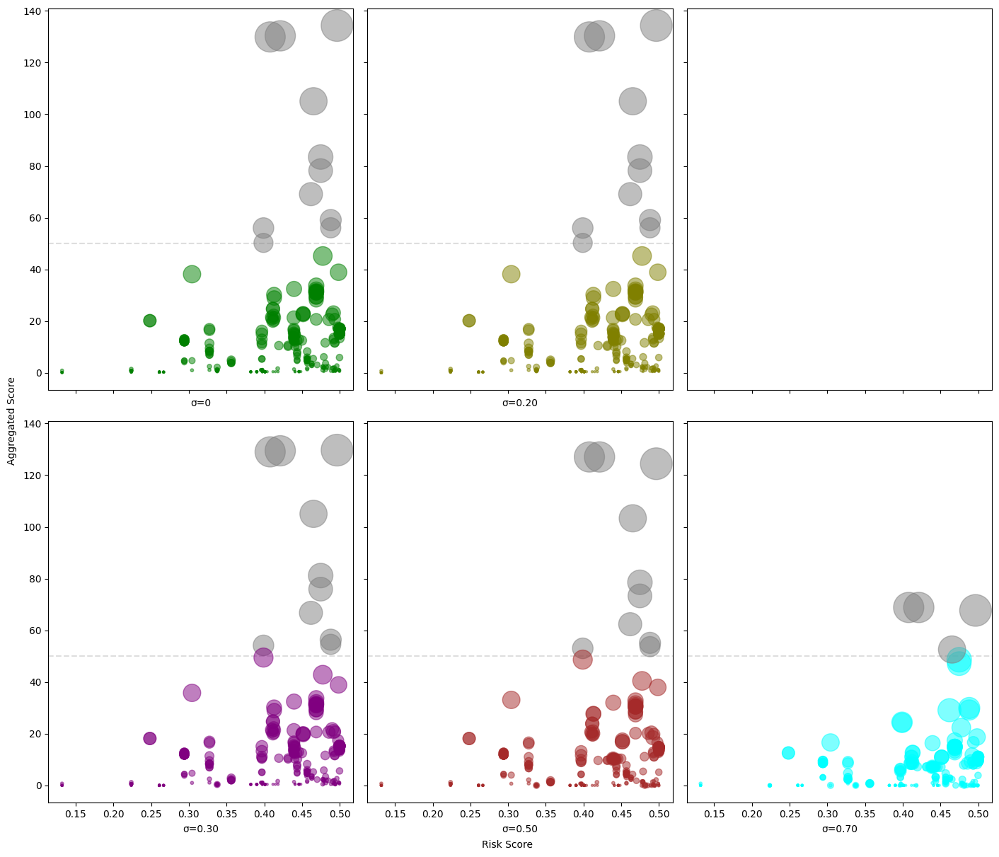

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')
df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_2.csv')

df2 = df1[df1['FinalRiskScore'] < .5]

x = df2['FinalRiskScore']
y_a_rs = df2['Agg_RS)']
y_a_rs20 = df2['Agg_RS20)']
y_a_rs30 = df2['Agg_RS30)']
y_a_rs50 = df2['Agg_RS50)']
y_a_rs70 = df2['Agg_RS70)']

GREY50 = "#7F7F7F"

df2['Cat0'] = np.where(df2['Agg_RS)'] > 50, GREY50, 'green')
df2['Cat20'] = np.where(df2['Agg_RS20)'] > 50, GREY50, 'olive')
df2['Cat30'] = np.where(df2['Agg_RS30)'] > 50, GREY50, 'purple')
df2['Cat50'] = np.where(df2['Agg_RS50)'] > 50, GREY50, 'brown')
df2['Cat70'] = np.where(df2['Agg_RS70)'] > 50, GREY50, 'cyan')

#df_pr_risk.loc[df_pr_risk['Id'] == i, 'Agg_RS)'].item()

sizes = df2['In_reach']*5



f, axes = plt.subplots(nrows = 2, ncols = 3,  figsize=(14, 12), sharex=True, sharey = True)

axes[0][0].scatter(x,y_a_rs,c=df2['Cat0'], marker = "o", s=sizes, alpha=0.5)
axes[0][0].set_xlabel('\u03C3=0', labelpad = 5)
axes[0][0].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')


axes[0][1].scatter(x,y_a_rs20,c=df2['Cat20'], marker = "o", s=sizes, alpha=0.5)
axes[0][1].set_xlabel('\u03C3=0.20', labelpad = 5)
axes[0][1].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')


axes[1][0].scatter(x,y_a_rs30,c=df2['Cat30'], marker = "o",s=sizes, alpha=0.5)
axes[1][0].set_xlabel('\u03C3=0.30', labelpad = 5)
axes[1][0].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')


axes[1][1].scatter(x,y_a_rs50,c=df2['Cat50'], marker = "o",s=sizes, alpha=0.5)
axes[1][1].set_xlabel('\u03C3=0.50', labelpad = 5)
axes[1][1].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')

axes[1][2].scatter(x,y_a_rs70,c=df2['Cat70'], marker = "o",s=sizes, alpha=0.5)
axes[1][2].set_xlabel('\u03C3=0.70', labelpad = 5)
axes[1][2].axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')


f.text(0.5, 0, 'Risk Score', ha='center', va='center')
f.text(0, 0.5, 'Aggregated Score', ha='center', va='center', rotation='vertical')

plt.tight_layout()
plt.savefig('CompareScatter_Low_3.pdf', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()

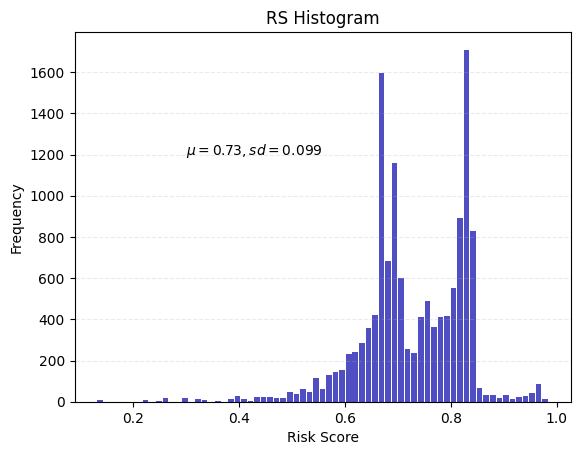

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import statistics


np.random.seed(444)
np.set_printoptions(precision=3)

d = np.random.laplace(loc=15, scale=3, size=500)

df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')
df4 = df3.sort_values(by='FinalRiskScore', ascending=False)
#df5 = df3.sort_values(by='Outgoing Risk (Inreach)', ascending=False)

x_axis = df4['FinalRiskScore'].dropna()

mean = statistics.mean(x_axis)
sd = statistics.stdev(x_axis)

#df4.hist(column='FinalRiskScore', bins=20);

# An "interface" to matplotlib.axes.Axes.hist() method
n, bins, patches = plt.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

# print(mean)
# print(sd)
plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('Risk Score')
plt.ylabel('Frequency')
plt.title('RS Histogram')
plt.text(0.3, 1200, r'$\mu=0.73, sd=0.099$')

plt.savefig('RS_Histo.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()
# Set a clean upper y-axis limit.
#plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)

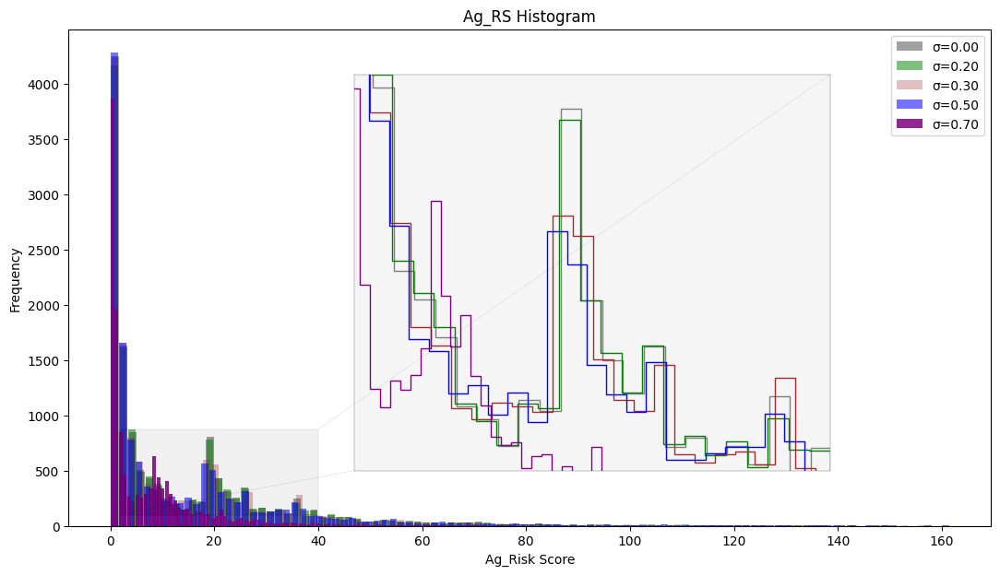

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import statistics
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, inset_axes

def set_sort_df(df_url, sorting_col):
  df = pd.read_csv(df_url)
  sorted_df = df.sort_values(by=sorting_col, ascending=False).dropna()
  return sorted_df

def drawFig(df_url, sorting_col, color, alpha_val, label):
  sorted_df = set_sort_df(df_url, sorting_col)
  x_axis = sorted_df[sorting_col].dropna()

  n, bins, patches = ax.hist(x=x_axis, bins='auto', color=color,
                              alpha=alpha_val, rwidth=0.85,zorder=1, label=label)
  plt.legend()
  plt.grid(False)
  plt.xlabel('Ag_Risk Score')
  plt.ylabel('Frequency')
  plt.title('Ag_RS Histogram')

def draw_inset(df_url, sorting_col, ax, p_x, p_y, x1, x2, y1, y2, width, height, color, alpha_val, zorder_val, label):
  sorted_df = set_sort_df(df_url, sorting_col)
  x = sorted_df[sorting_col]

  axins = inset_axes(ax, width, height, loc=2, bbox_to_anchor=(p_x, p_y),
                  bbox_transform=ax.figure.transFigure)

  for spine in ['bottom','top', 'right','left']:
    axins.spines[spine].set_color('grey')
    axins.spines[spine].set_linewidth(0.2)
    axins.spines[spine].set_alpha(.35)

  n, bins, patches = axins.hist(x, bins='auto', color=color,
                             rwidth=0.85, zorder=zorder_val, label=label, histtype='step', stacked=True, fill=False)
  axins.set_xlim(x1, x2)
  axins.set_ylim(y1, y2)
  mark_inset(ax, axins, loc1=1, loc2=3, fc=(0,0,0.01,0.01), ec=(0,0,0.01,0.05),lw=0.2)

  axins.axes.xaxis.set_ticklabels([])
  axins.axes.yaxis.set_ticklabels([])
  axins.set_xticks([])
  axins.set_yticks([])
  axins.set_facecolor("grey")
  axins.patch.set_alpha(.01)
  axins.patch.set_edgecolor('grey')




f, ax = plt.subplots(1, 1, figsize=(12.90,7))

#df_url = 'https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv'
df_url = 'https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_2.csv'


drawFig(df_url, 'Agg_RS)', 'grey', 0.75, '\u03C3=0.00')
drawFig(df_url, 'Agg_RS20)', 'green', 0.50, '\u03C3=0.20')
drawFig(df_url, 'Agg_RS30)', 'brown', 0.30, '\u03C3=0.30')
drawFig(df_url, 'Agg_RS50)', 'blue', 0.55, '\u03C3=0.50')
drawFig(df_url, 'Agg_RS70)', 'purple', 0.85, '\u03C3=0.70')

# plt.xlim([5, 40])
# plt.ylim([0, 900])

p_x, p_y = 0.36, .82
x1, x2 = 2, 40
y1, y2 = 100, 873

width, height =5.16, 4.3

draw_inset(df_url, 'Agg_RS)', ax, p_x, p_y, x1, x2, y1, y2, width, height, 'grey', .25, 1, '\u03C3=0.0' )
draw_inset(df_url, 'Agg_RS20)', ax, p_x, p_y, x1, x2, y1, y2, width, height, 'green', .45,2, '\u03C3=0.20' )
draw_inset(df_url, 'Agg_RS30)', ax, p_x, p_y, x1, x2, y1, y2, width, height, 'brown', .65, 3, '\u03C3=0.30' )
draw_inset(df_url, 'Agg_RS50)', ax, p_x, p_y, x1, x2, y1, y2, width, height, 'blue', .85, 4, '\u03C3=0.50' )
draw_inset(df_url, 'Agg_RS70)', ax, p_x, p_y, x1, x2, y1, y2, width, height, 'purple', .95, 5, '\u03C3=0.70' )


plt.savefig('Agg_RS_Histo_All_3.png', dpi=1200)
plt.show()

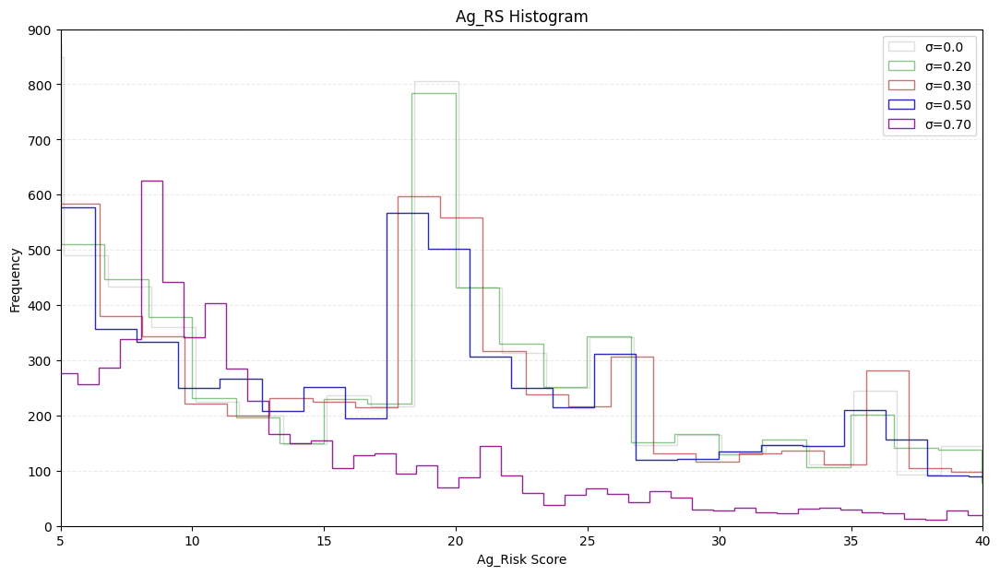

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import statistics
import pandas as pd

f, ax = plt.subplots(1, 1, figsize=(12.90,7))

#df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')
df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_2.csv')

df4 = df3.sort_values(by='Agg_RS)', ascending=False)
x_axis = df4['Agg_RS)'].dropna()

df20 = df3.sort_values(by='Agg_RS20)', ascending=False)
x_axis20 = df20['Agg_RS20)'].dropna()

df30 = df3.sort_values(by='Agg_RS30)', ascending=False)
x_axis30 = df30['Agg_RS30)'].dropna()

df50 = df3.sort_values(by='Agg_RS50)', ascending=False)
x_axis50 = df50['Agg_RS50)'].dropna()

df70 = df3.sort_values(by='Agg_RS70)', ascending=False)
x_axis70 = df50['Agg_RS70)'].dropna()


n, bins, patches = plt.hist(x=x_axis, bins='auto', color='grey',
                            alpha=0.25, rwidth=0.85,zorder=1, label='\u03C3=0.0',histtype='step', stacked=True, fill=False)
n, bins, patches = plt.hist(x=x_axis20, bins='auto', color='green',
                            alpha=0.45, rwidth=0.85, zorder=2,label='\u03C3=0.20', histtype='step', stacked=True,fill=False)

n, bins, patches = plt.hist(x=x_axis30, bins='auto', color='brown',
                            alpha=0.65, rwidth=0.85,zorder=3,label='\u03C3=0.30',histtype='step', stacked=True,fill=False)
n, bins, patches = plt.hist(x=x_axis50, bins='auto', color='#0504aa',
                            alpha=0.85, rwidth=0.85, zorder=4, label='\u03C3=0.50',histtype='step', stacked=True,fill=False)
n, bins, patches = plt.hist(x=x_axis70, bins='auto', color='purple',
                            alpha=0.85, rwidth=0.85, zorder=5, label='\u03C3=0.70',histtype='step', stacked=True,fill=False)

plt.legend()

plt.xlim([5, 40])
plt.ylim([0, 900])


plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('Ag_Risk Score')
plt.ylabel('Frequency')
plt.title('Ag_RS Histogram')
plt.savefig('Agg_RS_Histo_trimmed_3.png', dpi=1200)
plt.show()

array([[<Axes: title={'center': 'FinalRiskScore'}>]], dtype=object)

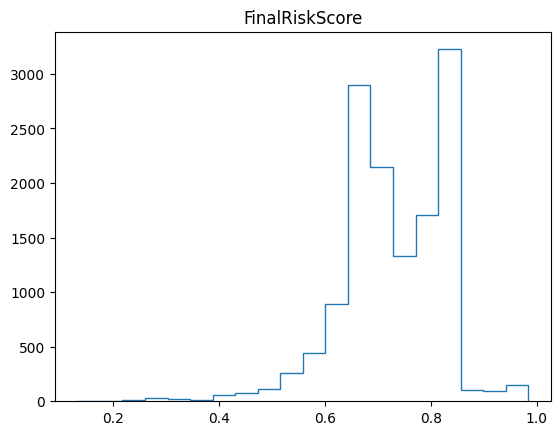

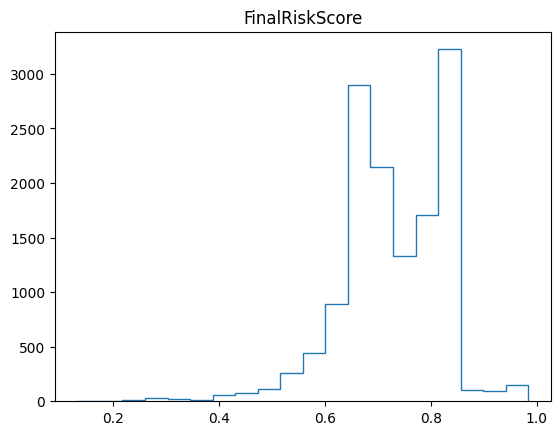

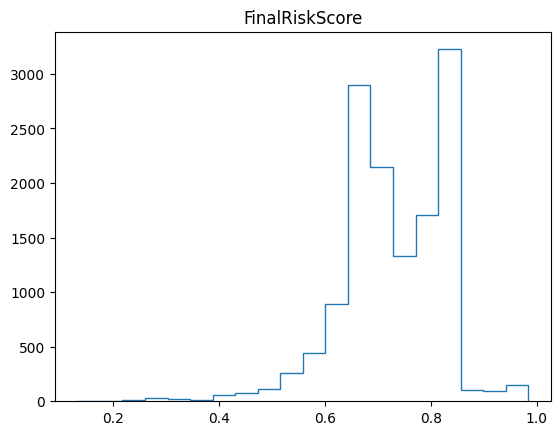

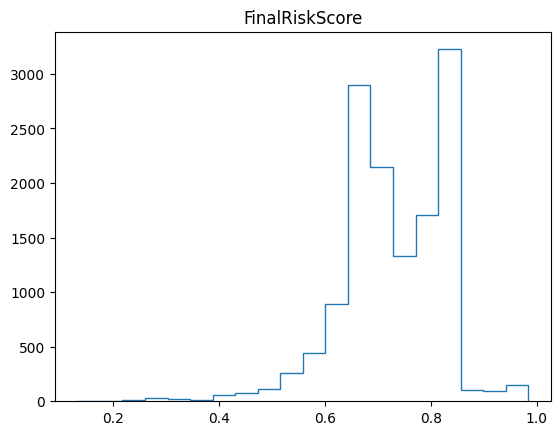

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(seed=42)
data_points = 1000

df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')

df4 = df3.sort_values(by='Agg_RS)', ascending=False)
df20 = df3.sort_values(by='Agg_RS20)', ascending=False)
df30 = df3.sort_values(by='Agg_RS30)', ascending=False)
df50 = df3.sort_values(by='Agg_RS50)', ascending=False)

df4.hist(column='FinalRiskScore', bins=20, stacked=True, histtype='step', grid=False)
df20.hist(column='FinalRiskScore', bins=20, stacked=True, histtype='step', grid=False)
df30.hist(column='FinalRiskScore', bins=20, stacked=True, histtype='step', grid=False)
df50.hist(column='FinalRiskScore', bins=20, stacked=True, histtype='step', grid=False)


<ipython-input-6-9113512af208>:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['%.2f' %i for i in newvals])


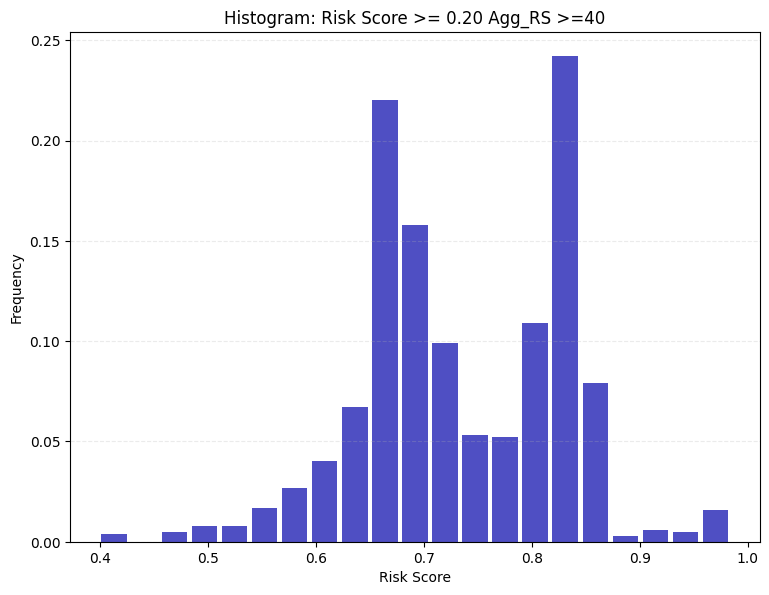

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df11 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')
df1 = df11.sort_values(by='FinalRiskScore', ascending=False)

#df1 = df12[df12['FinalRiskScore'] < .5]

df2 = df1.loc[(df1['Agg_RS)']>=40) & (df1['FinalRiskScore']>= 0.20),
                    ['Id','Label', 'FinalRiskScore','Agg_RS)','Agg_RS20)','Agg_RS30)','Agg_RS50)']]

x_axis = df2['FinalRiskScore'].dropna()

f, ax = plt.subplots(1, 1, figsize=(8.90,6.62))

n, bins, patches = plt.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

vals = ax.get_yticks()
newvals = vals/1000
ax.set_yticklabels(['%.2f' %i for i in newvals])


plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
# plt.grid(axis='x', alpha=0.75)
#plt.ylim(0, 1)
plt.xlabel('Risk Score')
plt.ylabel('Frequency')
plt.title('Histogram: Risk Score >= 0.20 Agg_RS >=40')
plt.savefig('newHist_high_low.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()


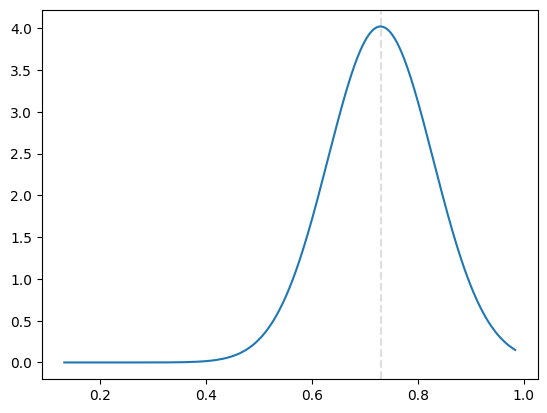

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics
import pandas as pd

df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')
df4 = df3.sort_values(by='FinalRiskScore', ascending=False)
#df5 = df3.sort_values(by='Outgoing Risk (Inreach)', ascending=False)

x_axis = df4['FinalRiskScore'].dropna()
#x_axis1 = df5['Outgoing Risk (Inreach)'].dropna()/df5['Outgoing Risk (Inreach)'].max()

mean = statistics.mean(x_axis)
sd = statistics.stdev(x_axis)

plt.plot(x_axis, norm.pdf(x_axis, mean, sd))
plt.axvline(np.mean(x_axis), color='#7F7F7F',  alpha=0.25, zorder=0, linestyle = '--')
#plt.plot(x_axis1, norm.pdf(x_axis1, mean1, sd1))
plt.savefig('11.png')
plt.show()

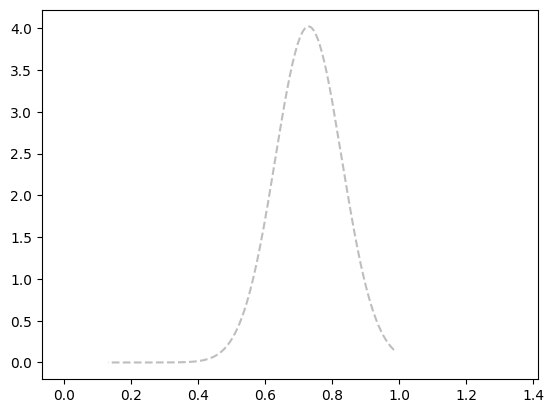

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics
import pandas as pd

df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')
df4 = df3.sort_values(by='FinalRiskScore', ascending=False)
df5 = df3.sort_values(by='Agg_RS)', ascending=False)

x_axis = df4['FinalRiskScore'].dropna()
x_axis1 = df5['Agg_RS)'].dropna()/120

mean = statistics.mean(x_axis)
sd = statistics.stdev(x_axis)

mean1 = statistics.mean(x_axis1)
sd1 = statistics.stdev(x_axis1)

plt.plot(x_axis, norm.pdf(x_axis, mean, sd), color='#7F7F7F',  alpha=0.50, zorder=0, linestyle = '--')
plt.plot(x_axis1, norm.pdf(x_axis1, mean1, sd1), color='#7F7F7F',  alpha=0, zorder=0, linestyle = '--')
plt.show()

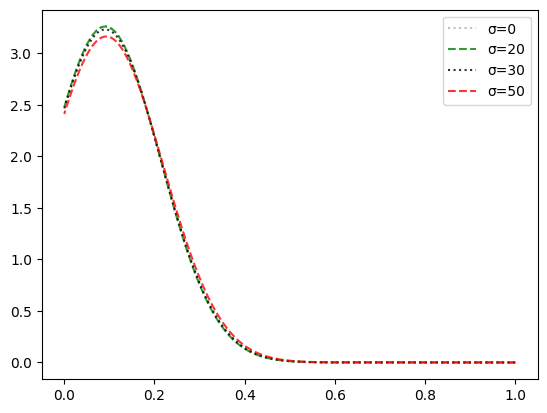

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics
import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')

df0 = df.sort_values(by='Agg_RS)', ascending=False)
x_axis0 = df0['Agg_RS)'].dropna()/df0['Agg_RS)'].dropna().max()
mean0 = statistics.mean(x_axis0)
sd0 = statistics.stdev(x_axis0)
plt.plot(x_axis0, norm.pdf(x_axis0, mean0, sd0), color='grey',  alpha=0.50, zorder=0, linestyle = ':', label='\u03C3=0')
plt.legend()

df20 = df.sort_values(by='Agg_RS20)', ascending=False)
x_axis20 = df20['Agg_RS20)'].dropna()/df20['Agg_RS20)'].dropna().max()
mean20 = statistics.mean(x_axis20)
sd20 = statistics.stdev(x_axis20)
plt.plot(x_axis20, norm.pdf(x_axis20, mean20, sd20), color='green',  alpha=0.8, zorder=0,linestyle = '--', label='\u03C3=20')
plt.legend()

df30 = df.sort_values(by='Agg_RS30)', ascending=False)
x_axis30 = df30['Agg_RS30)'].dropna()/df30['Agg_RS30)'].dropna().max()
mean30 = statistics.mean(x_axis30)
sd30 = statistics.stdev(x_axis30)
plt.plot(x_axis30, norm.pdf(x_axis30, mean30, sd30), color='black',  alpha=0.8, zorder=0, linestyle = ':', label='\u03C3=30')
plt.legend()

df50 = df.sort_values(by='Agg_RS50)', ascending=False)
x_axis50 = df50['Agg_RS50)'].dropna()/df50['Agg_RS50)'].dropna().max()
mean50 = statistics.mean(x_axis50)
sd50 = statistics.stdev(x_axis50)
plt.plot(x_axis50, norm.pdf(x_axis50, mean50, sd50), color='red',  alpha=0.80, zorder=0,linestyle = '--', label='\u03C3=50')
plt.legend()

plt.show()

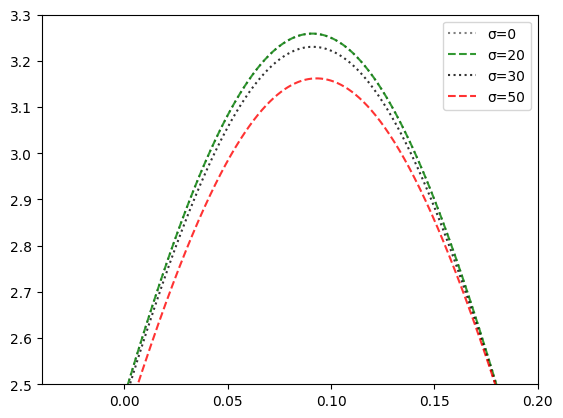

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics
import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv')

df0 = df.sort_values(by='Agg_RS)', ascending=False)
x_axis0 = df0['Agg_RS)'].dropna()/df0['Agg_RS)'].dropna().max()
mean0 = statistics.mean(x_axis0)
sd0 = statistics.stdev(x_axis0)
plt.plot(x_axis0, norm.pdf(x_axis0, mean0, sd0), color='grey', zorder=0, linestyle = ':', label='\u03C3=0')
plt.legend()
plt.ylim([2.5, 3.3])
plt.xlim([-.04, .20])

df20 = df.sort_values(by='Agg_RS20)', ascending=False)
x_axis20 = df20['Agg_RS20)'].dropna()/df20['Agg_RS20)'].dropna().max()
mean20 = statistics.mean(x_axis20)
sd20 = statistics.stdev(x_axis20)
plt.plot(x_axis20, norm.pdf(x_axis20, mean20, sd20), color='green',  alpha=0.8, zorder=0,linestyle = '--', label='\u03C3=20')
plt.legend()
plt.ylim([2.5, 3.3])
plt.xlim([-.04, .20])

df30 = df.sort_values(by='Agg_RS30)', ascending=False)
x_axis30 = df30['Agg_RS30)'].dropna()/df30['Agg_RS30)'].dropna().max()
mean30 = statistics.mean(x_axis30)
sd30 = statistics.stdev(x_axis30)
plt.plot(x_axis30, norm.pdf(x_axis30, mean30, sd30), color='black',  alpha=0.8, zorder=0, linestyle = ':', label='\u03C3=30')
plt.legend()
plt.ylim([2.5, 3.3])
plt.xlim([-.04, .20])

df50 = df.sort_values(by='Agg_RS50)', ascending=False)
x_axis50 = df50['Agg_RS50)'].dropna()/df50['Agg_RS50)'].dropna().max()
mean50 = statistics.mean(x_axis50)
sd50 = statistics.stdev(x_axis50)
plt.plot(x_axis50, norm.pdf(x_axis50, mean50, sd50), color='red',  alpha=0.80, zorder=0,linestyle = '--', label='\u03C3=50')
plt.legend()
plt.ylim([2.5, 3.3])
plt.xlim([-.04, .20])

plt.show()

<ipython-input-209-914abe01b246>:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig('Agg_RS_Gaussian_All_1.png', dpi=1200)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


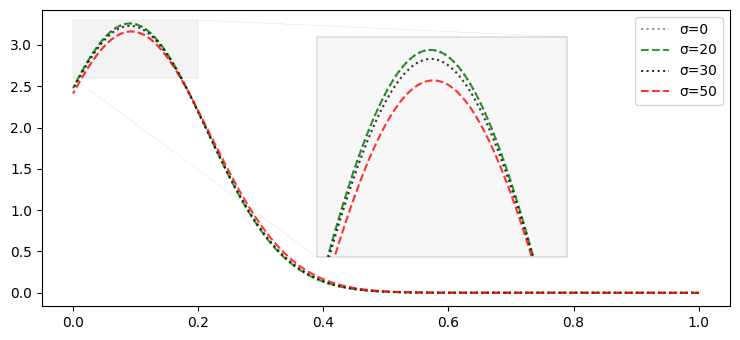

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, inset_axes

def set_sort_df(df_url, sorting_col):
  df = pd.read_csv(df_url)
  sorted_df = df.sort_values(by=sorting_col, ascending=False).dropna()
  return sorted_df

def drawFig(df_url, sorting_col, color, linestyle, label):
  sorted_df = set_sort_df(df_url, sorting_col)
  x_col = sorted_df[sorting_col]
  x = x_col/x_col.max()
  mean = statistics.mean(x)
  sd = statistics.stdev(x)
  y= norm.pdf(x, mean, sd)
  ax.plot(x, y, color=color, zorder=0, alpha=0.80, linestyle = linestyle, label=label)
  plt.legend()

def draw_inset(df_url, sorting_col, ax, p_x, p_y, x1, x2, y1, y2, width, height, color, linestyle ):
  sorted_df = set_sort_df(df_url, sorting_col)
  x_col = sorted_df[sorting_col]
  x = x_col/x_col.max()
  mean = statistics.mean(x)
  sd = statistics.stdev(x)
  y= norm.pdf(x, mean, sd)
  axins = inset_axes(ax, width, height, loc=2, bbox_to_anchor=(p_x, p_y),
                  bbox_transform=ax.figure.transFigure)
  axins.plot(x, y, color=color, zorder=0, alpha=0.80, linestyle = linestyle)
  axins.set_xlim(x1, x2)
  axins.set_ylim(y1, y2)
  mark_inset(ax, axins, loc1=1, loc2=3, fc=(0,0,0.01,0.01), ec=(0,0,0.01,0.05),lw=0.2)

  axins.axes.xaxis.set_ticklabels([])
  axins.axes.yaxis.set_ticklabels([])
  axins.set_xticks([])
  axins.set_yticks([])
  axins.set_facecolor("grey")
  axins.patch.set_alpha(.01)
  axins.patch.set_edgecolor('grey')

  for spine in ['bottom','top', 'right','left']:
    axins.spines[spine].set_color('grey')
    axins.spines[spine].set_linewidth(0.2)
    axins.spines[spine].set_alpha(.35)


df_url = 'https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Agg_RS_full_1.csv'

fig, ax = plt.subplots()

drawFig(df_url, 'Agg_RS)','grey', ':', '\u03C3=0')
drawFig(df_url, 'Agg_RS20)','green', '--', '\u03C3=20')
drawFig(df_url, 'Agg_RS30)','black', ':', '\u03C3=30')
drawFig(df_url, 'Agg_RS50)','red', '--', '\u03C3=50')

p_x, p_y = 0.42, 0.9
x1, x2 = 0, .2
y1, y2 = 2.6, 3.3

width, height =2.5, 2.2

draw_inset(df_url, 'Agg_RS)', ax, p_x, p_y,x1, x2,y1, y2, width, height, 'grey', ':')
draw_inset(df_url, 'Agg_RS20)', ax, p_x, p_y,x1, x2,y1, y2, width, height, 'green', '--')
draw_inset(df_url, 'Agg_RS30)', ax, p_x, p_y,x1, x2,y1, y2, width, height, 'black', ':')
draw_inset(df_url, 'Agg_RS50)', ax, p_x, p_y,x1, x2,y1, y2, width, height, 'red', '--')

#edgecolor='b'
#plt.savefig('Agg_RS_Gaussian_All_1.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.savefig('Agg_RS_Gaussian_All_1.png', dpi=1200)
plt.show()


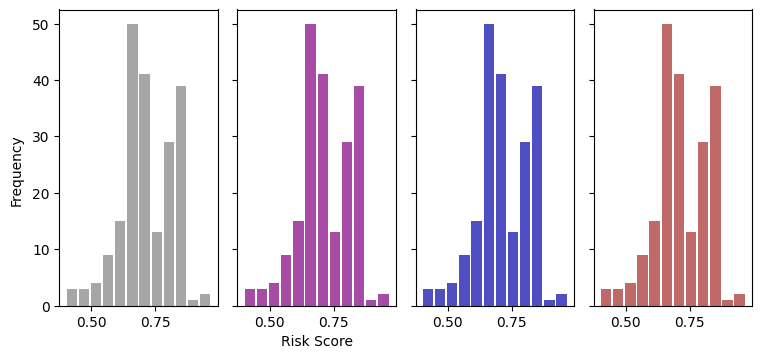

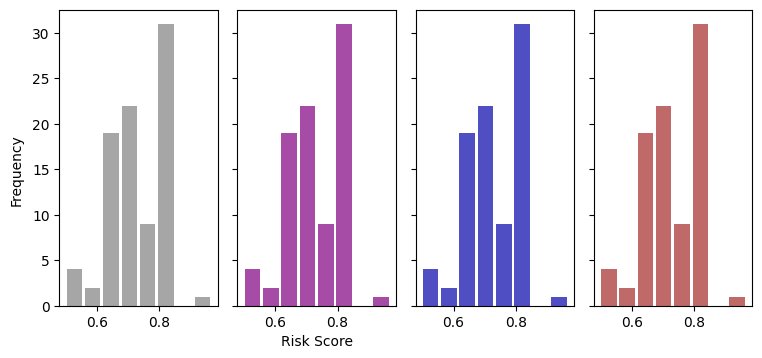

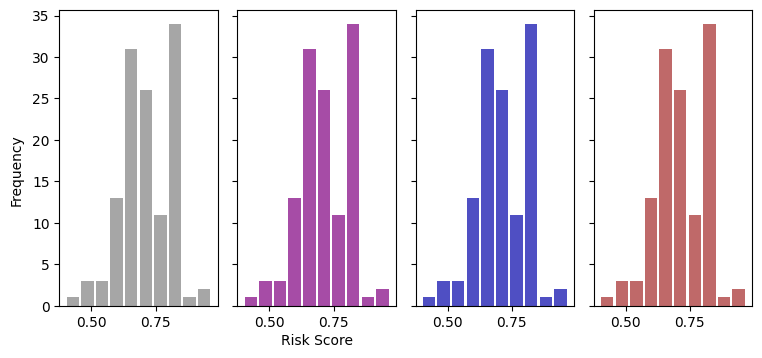

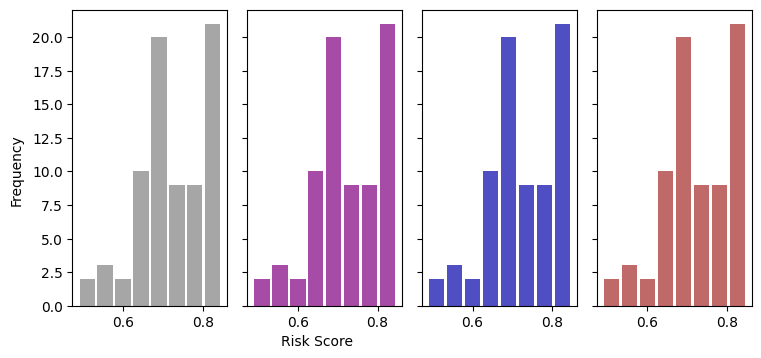

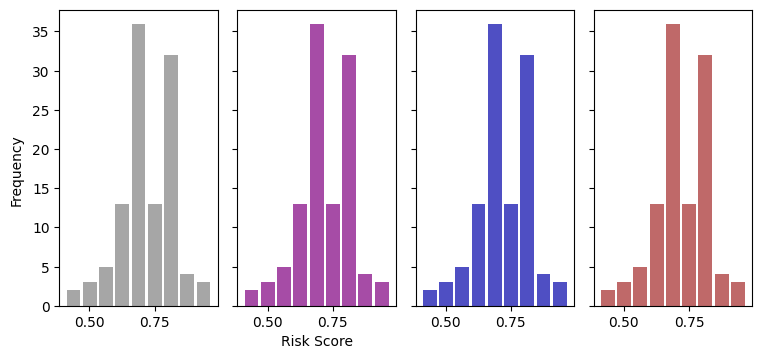

...

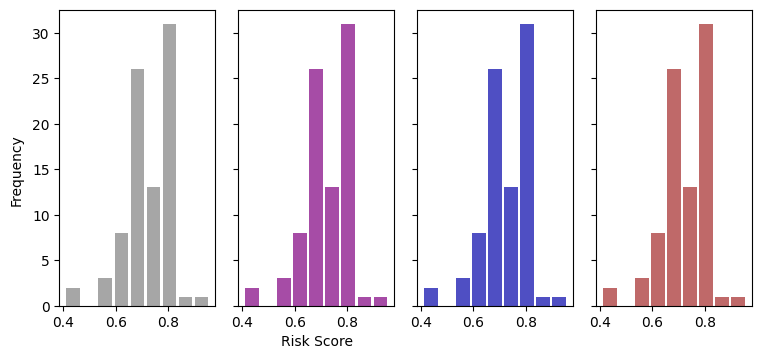

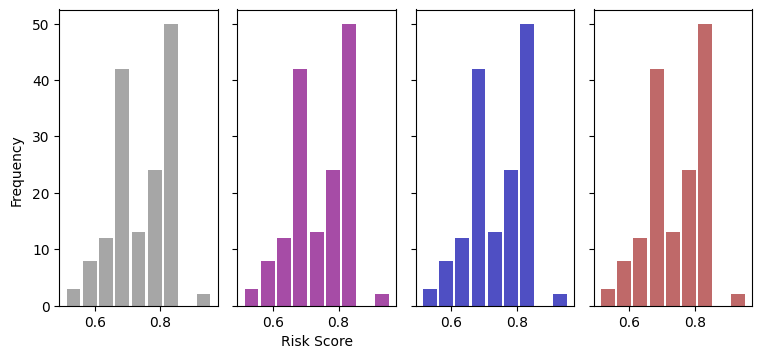

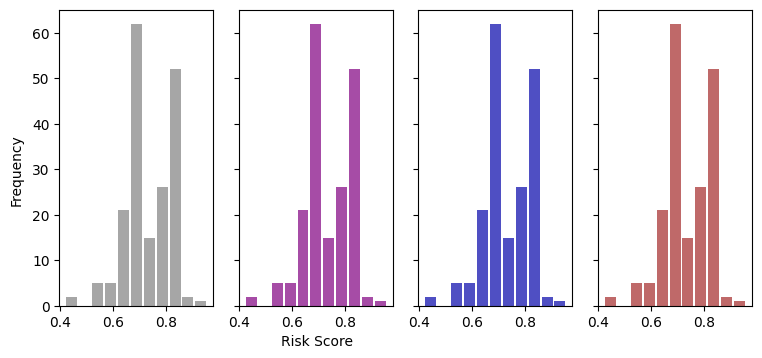

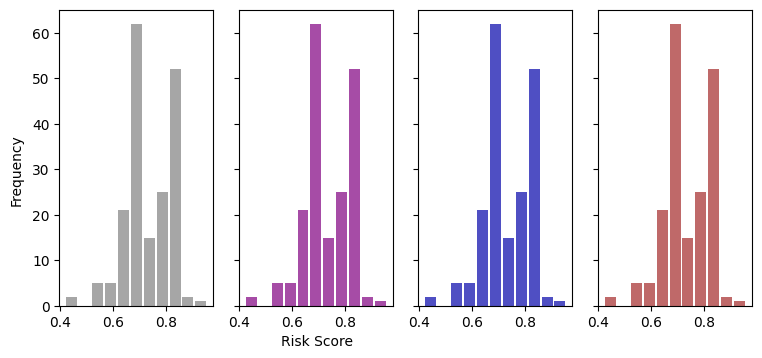

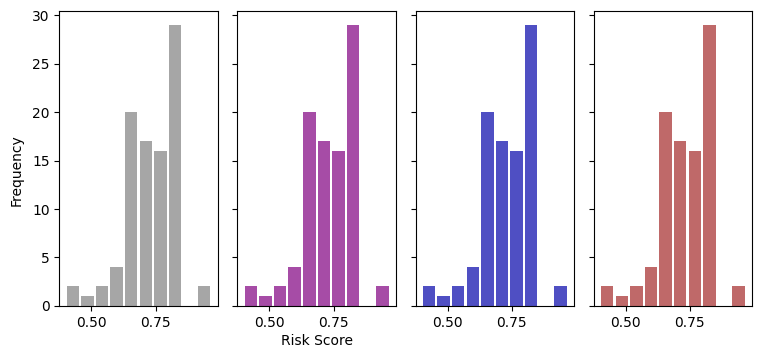

In [ ]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure


df_sc = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/edge.csv')
g_sc = nx.from_pandas_edgelist(df_sc, source='Source', target='Target', edge_attr =None, create_using=nx.DiGraph())
r_g_sc = nx.reverse(g_sc)

node_arr = []

for node in g_sc.nodes:
  node_arr.append(node)

df_pr_risk = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df_sorted = df_pr_risk.sort_values(by='FinalRiskScore', ascending=False)
df_low = df_sorted[df_sorted['FinalRiskScore'] < .5]
df2 = df_low.loc[(df_low['Outgoing Risk (Inreach)']>=40) & (df_low['FinalRiskScore']>= 0.20),
                    ['Id','Label', 'FinalRiskScore','Outgoing Risk (Inreach)']]

list_of_reach_node_list = [[] for _ in range(len(df_pr_risk['Id']))]


for k in df2['Id']:
  for reach_nodes in nx.shortest_path(g_sc, k).keys():
    list_of_reach_node_list[k].append(reach_nodes)

i = 0

for row in list_of_reach_node_list:
  sum=0
  new_rs = []

  if row:
    for node_id in row:
      if np.isnan(df_pr_risk['FinalRiskScore'][node_id]):
        continue
      new_rs.append(df_pr_risk['FinalRiskScore'][node_id])
  if new_rs:
    x_axis = new_rs
    #f, ax = plt.subplots(1, 1,figsize=(5,4))

    f, ((ax0, ax1, ax2, ax3)) = plt.subplots(nrows=1, ncols=4, sharex=True, sharey = True)

    n, bins, patches = ax0.hist(x=x_axis, bins='auto', color='grey',
                            alpha=0.7, rwidth=0.85)
    n, bins, patches = ax1.hist(x=x_axis, bins='auto', color='purple',
                            alpha=0.7, rwidth=0.85)
    n, bins, patches = ax2.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)
    n, bins, patches = ax3.hist(x=x_axis, bins='auto', color='brown',
                            alpha=0.7, rwidth=0.85)

    # plt.xlabel('Dep. Risk Score of '+str(i))
    # plt.ylabel('Frequency')

    rs = df_pr_risk.loc[df_pr_risk['Id'] == i, 'FinalRiskScore'].item()
    a_rs = df_pr_risk.loc[df_pr_risk['Id'] == i, 'Outgoing Risk (Inreach)'].item()

    f.text(0.4, 0.01, 'Risk Score', ha='center', va='center')
    f.text(0, 0.5, 'Frequency', ha='center', va='center', rotation='vertical')

    #plt.tight_layout()

    #plt.title('Hist for '+str(i)+", R="+str(len(new_rs))+" RS "+str(round(rs,2))+" A_RS "+str(round(a_rs, 2)))
    #plt.savefig('Hstgrm_'+str(i)+".png", facecolor='w', edgecolor='b',transparent=True)
    plt.show()
  i = i +1

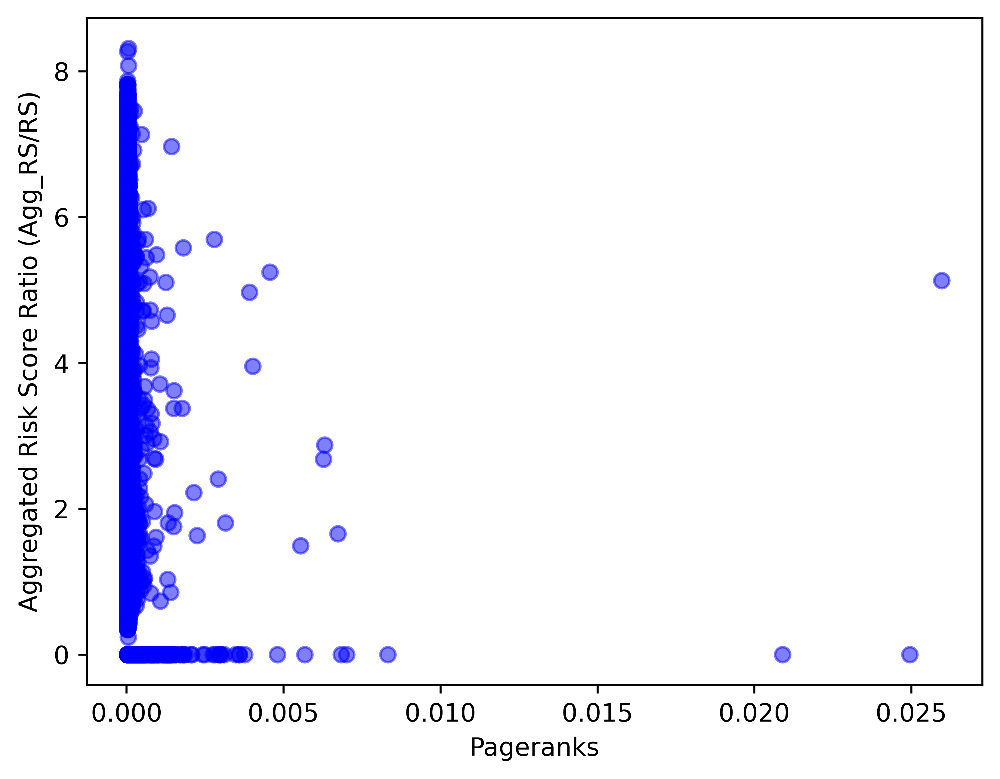

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import math

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')

#df1['Cat'] = np.where(df1['FinalRiskScore'] > 0.5,'red', 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3


plt.scatter(df1['Pageranks'],np.log2(df1['Agg_vs_RS']), c='blue', alpha=0.5)
#plt.scatter(df1['FinalRiskScore'], df1['Agg_RS50)'], c='grey', alpha=0.15)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('Pageranks')
plt.ylabel('Aggregated Risk Score Ratio (Agg_RS/RS)')

plt.savefig('Test2.png')
plt.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


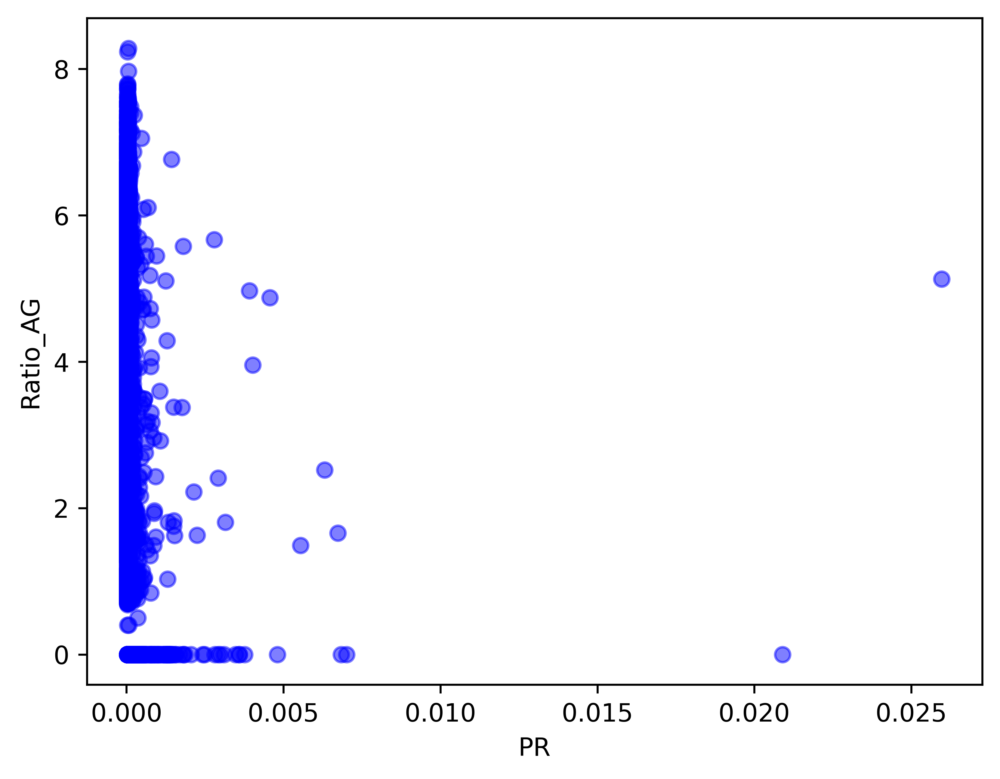

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import math

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')

#df1['Cat'] = np.where(df1['FinalRiskScore'] > 0.5,'red', 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3

#
#
# Agg_RS20_vs_RS,Agg_RS30_vs_RS,Agg_RS50_vs_RS
plt.scatter(df1['Pageranks'],np.log2(df1['Agg_RS50_vs_RS']), c='blue', alpha=0.5)
#plt.scatter(df1['FinalRiskScore'], df1['Agg_RS50)'], c='grey', alpha=0.15)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('PR')
plt.ylabel('Ratio_AG')

plt.savefig('score-vs-ag_score-0.png')
plt.show()

RuntimeError: ignored

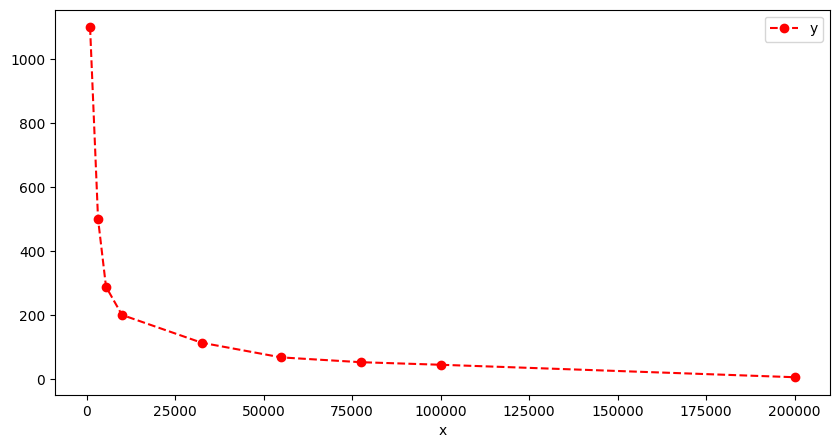

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

x = np.asarray([ 1000, 3250, 5500, 10000, 32500, 55000, 77500, 100000, 200000 ])
y = np.asarray([ 1100, 500, 288, 200, 113, 67, 52, 44, 5 ])

df.plot(x='x', y='y', kind='line', style='--ro', figsize=(10, 5))

def func_powerlaw(x, m, c, c0):
    return c0 + x**m * c

target_func = func_powerlaw

X = df['x']
y = df['y']



sol1 = curve_fit(func_powerlaw, x, y, maxfev=2000 )
sol2 = curve_fit(func_powerlaw, x, y, p0 = np.asarray([-1,10**5,0]))

popt, pcov = curve_fit(target_func, X, y)

plt.figure(figsize=(10, 5))
plt.plot(X, target_func(X, *popt), '--')
plt.plot(X, y, 'ro')
plt.legend()
plt.show()

In [ ]:
import torch
from torch.nn.functional import mse_loss
from collections import namedtuple
from itertools import count
from random import gauss, seed
seed(49)

# Our model
def f(x, A, B, k):
    return A*(x**k)+B

# Generate sample data
A = gauss(0, 10)
B = gauss(0, 10)
k = gauss(0, 10)
x = torch.arange(1, 10, dtype=torch.float)
y = f(x, A, B, k)
print(f"A={A}, B={B}, k={k}")
print(x)
print(y)

# Define the parameters
Params = namedtuple("Params", "A B k")

params = Params(A=torch.tensor([1.0], requires_grad=True),
                B=torch.tensor([1.0], requires_grad=True),
                k=torch.tensor([1.0], requires_grad=True))

# Fit the parameters
optimizer = torch.optim.Adam(params, lr=1)

tol = 1e-6 # MSE Loss error tolerance
for i in count():
    optimizer.zero_grad()
    y_hat = f(x, params.A, params.B, params.k)
    # Take the logarithm for improved numerical stability
    L = mse_loss(torch.log(y_hat), torch.log(y))
    if L < tol:
        break
    if i % 1000 == 0:
        print(f"Loss ({i}): {L.item()}")
    L.backward()
    optimizer.step()

print(params.A.item(), A)
print(params.B.item(), B)
print(params.k.item(), k)

A=9.42764034916727, B=4.212889473371394, k=12.835248103593624
tensor([1., 2., 3., 4., 5., 6., 7., 8., 9.])
tensor([1.3641e+01, 6.8901e+04, 1.2542e+07, 5.0349e+08, 8.8279e+09, 9.1657e+10,
        6.6290e+11, 3.6795e+12, 1.6686e+13])
Loss (0): 421.67230224609375
Loss (1000): 0.0005562866572290659
Loss (2000): 9.597707503417041e-06
9.461641311645508 9.42764034916727
4.171230792999268 4.212889473371394
12.833184242248535 12.835248103593624


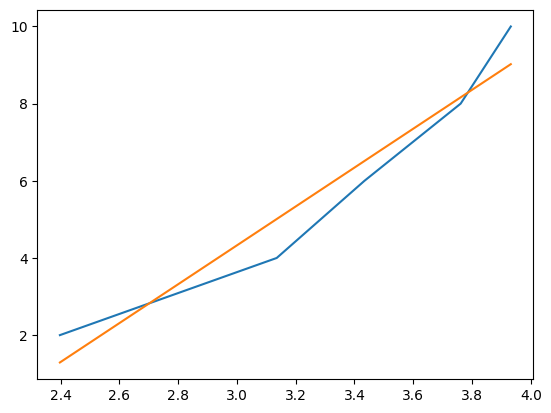

In [ ]:
x_data = np.array([11, 23, 31, 43, 51])
y_data = np.array([2, 4, 6, 8, 10])

log_x_data = np.log(x_data)
curve = np.polyfit(log_x_data, y_data, 1)

y = curve[0]*log_x_data + curve[1]

# Blue color
plt.plot(log_x_data, y_data)

# Best fit in orange
plt.plot(log_x_data, y)

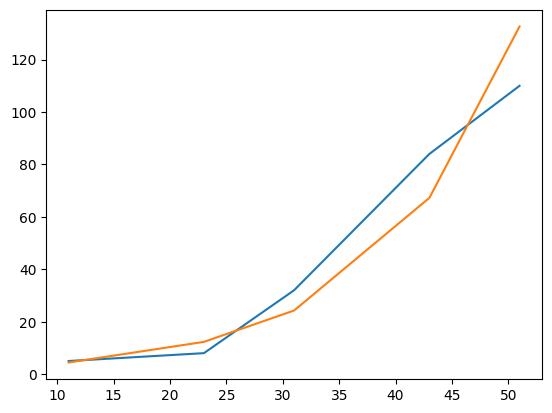

In [ ]:
x_data = np.array([11, 23, 31, 43, 51])
y_data = np.array([5, 8, 32, 84, 110])

ylog_data = np.log(y_data)

curve_fit = np.polyfit(x_data, ylog_data, 1)

y = np.exp(curve_fit[1]) * np.exp(curve_fit[0]*x_data)

plt.plot(x_data, y_data)

plt.plot(x_data, y)


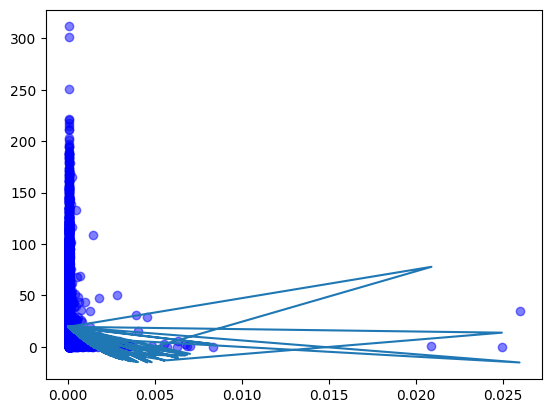

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')

x = df1['Pageranks']
y= df1['Agg_RS50_vs_RS']

plt.scatter(x,y, c='blue', alpha=0.5)

#calculate equation for quadratic trendline
z = np.polyfit(x, y, 3)
p = np.poly1d(z)

#add trendline to plot
plt.plot(x, p(x))

In [ ]:
import plotly.express as px

df = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')


fig = px.scatter(df, x="Pageranks", y="Agg_RS50_vs_RS",
                 trendline="ols", trendline_options=dict(log_x=True),
                 title="Log-transformed fit on linear axes")
fig.show()

def Gauss(x, A, B):
    y = A*np.exp(-1*B*x**2)
    return y

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


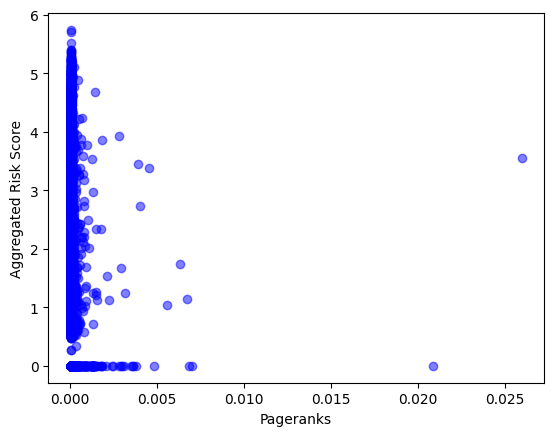

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')

x_data = df['Pageranks']
y_data = df['Agg_RS50_vs_RS']

# x_data = np.array([11, 23, 31, 43, 51])
# y_data = np.array([5, 8, 32, 84, 110])

ylog_data = np.log(y_data)

#3plt.scatter(x_data, y_data, c='blue', alpha=0.5)

plt.scatter(x_data, ylog_data, c='blue', alpha=0.5)

# plt.scatter(df, x="Pageranks", y="Agg_RS50_vs_RS",
#                  trendline="ols", trendline_options=dict(log_x=True),
#                  title="Log-transformed fit on linear axes")

# plt.plot(x_data, y)

plt.xlabel('Pageranks')
plt.ylabel('Aggregated Risk Score Ratio (Agg_RS/RS)')

plt.savefig('score-vs-ag_score-1.png', dpi=1200)
plt.show()


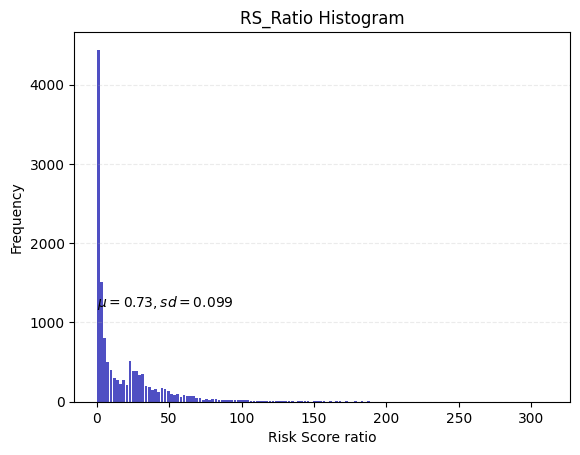

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import statistics


np.random.seed(444)
np.set_printoptions(precision=3)

d = np.random.laplace(loc=15, scale=3, size=500)

#df = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')

df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')
df4 = df3.sort_values(by='Agg_RS50_vs_RS', ascending=False)
#df5 = df3.sort_values(by='Outgoing Risk (Inreach)', ascending=False)

x_axis = df4['Agg_RS50_vs_RS'].dropna()

mean = statistics.mean(x_axis)
sd = statistics.stdev(x_axis)

#df4.hist(column='FinalRiskScore', bins=20);

# An "interface" to matplotlib.axes.Axes.hist() method
n, bins, patches = plt.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

# print(mean)
# print(sd)
plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('Risk Score ratio')
plt.ylabel('Frequency')
plt.title('RS_Ratio Histogram')
#plt.text(0.3, 1200, r'$\mu=0.73, sd=0.099$')

plt.savefig('RS_Histo1.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()
# Set a clean upper y-axis limit.
#plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)

<ipython-input-17-e5ad7d6d17c1>:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['%.2f' %i for i in newvals])


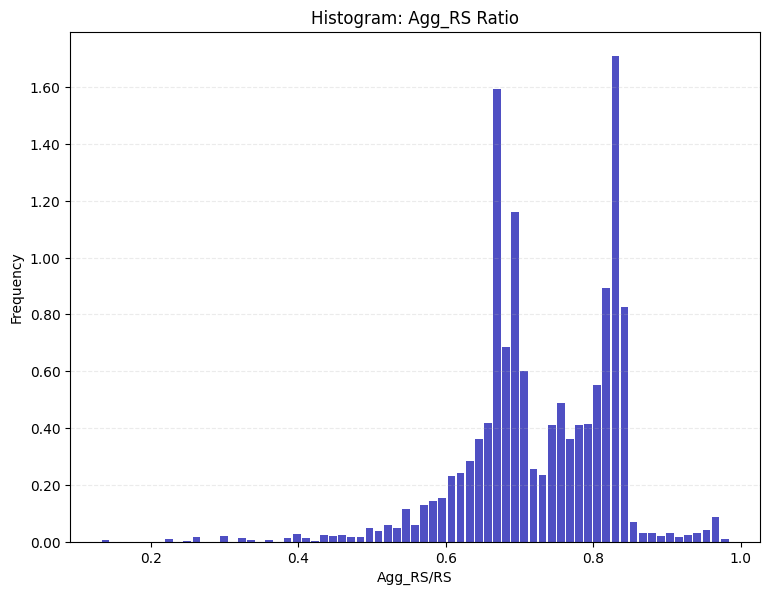

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df11 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')
df1 = df11.sort_values(by='Agg_vs_RS', ascending=False)

#df1 = df12[df12['FinalRiskScore'] < .5]

# df2 = df1.loc[(df1['Agg_RS)']>=40) & (df1['FinalRiskScore']>= 0.20),
#                     ['Id','Label', 'FinalRiskScore','Agg_RS)','Agg_RS20)','Agg_RS30)','Agg_RS50)']]

x_axis = df1['FinalRiskScore'].dropna()

f, ax = plt.subplots(1, 1, figsize=(8.90,6.62))

n, bins, patches = plt.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

vals = ax.get_yticks()
newvals = vals/1000
ax.set_yticklabels(['%.2f' %i for i in newvals])


plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
# plt.grid(axis='x', alpha=0.75)
#plt.ylim(0, 1)
plt.xlabel('Agg_RS/RS')
plt.ylabel('Frequency')
plt.title('Histogram: Agg_RS Ratio')
plt.savefig('newHist_high_low.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()


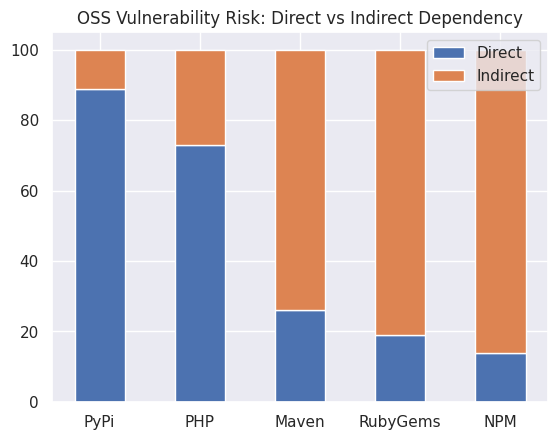

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

# data from https://allisonhorst.github.io/palmerpenguins/

species = (
    "PyPi",
    "PHP",
    "Maven",
    "RubyGems",
    "NPM",
)
weight_counts = {
    "Direct": np.array([89, 73, 26, 19, 14]),
    "Indirect": np.array([11, 27, 74, 81, 86]),
}
width = 0.5

fig, ax = plt.subplots()
bottom = np.zeros(5)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(species, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

# top_bar = mpatches.Patch(color='red')
# bottom_bar = mpatches.Patch(color='green')
# plt.legend(handles=[top_bar, bottom_bar])

ax.set_title("OSS Vulnerability Risk: Direct vs Indirect Dependency")
ax.legend(loc="upper right")
plt.savefig('text.pdf', dpi=600, facecolor='w', edgecolor='b')
plt.show()

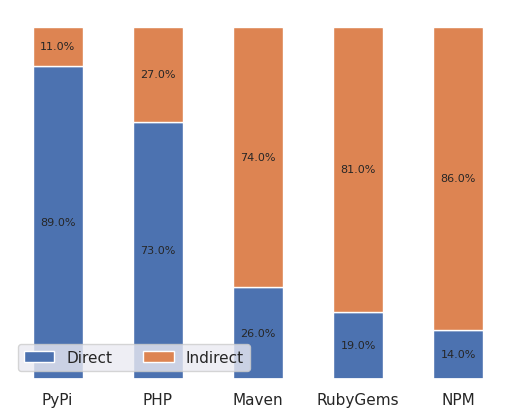

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# import matplotlib.patches as mpatches
from matplotlib.pyplot import figure

# data from https://allisonhorst.github.io/palmerpenguins/

species = (
    "PyPi",
    "PHP",
    "Maven",
    "RubyGems",
    "NPM",
)
weight_counts = {
    "Direct": np.array([89, 73, 26, 19, 14]),
    "Indirect": np.array([11, 27, 74, 81, 86]),
}
width = 0.5

fig, ax = plt.subplots()
bottom = np.zeros(5)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(species, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count


#ax = df.plot(stacked=True, kind='bar', figsize=(12, 8), rot='horizontal')

# .patches is everything inside of the chart
for rect in ax.patches:
    # Find where everything is located
    height = rect.get_height()
    width = rect.get_width()
    x = rect.get_x()
    y = rect.get_y()

    # The height of the bar is the data value and can be used as the label
    label_text = f'{height}'+'%'  # f'{height:.2f}' to format decimal values

    # ax.text(x, y, text)
    label_x = x + width / 2
    label_y = y + height / 2

    # plot only when height is greater than specified value
    if height > 0:
        ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)

#plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')

#ax.set_title("OSS Vulnerability Risk: Direct vs Indirect Dependency")
ax.set_facecolor("white")
ax.legend(loc=3, ncol=2)

ax.get_yaxis().set_visible(False)

#ax.legend(ncol=2)
plt.savefig('fig22.png', dpi=600)
plt.show()

In [ ]:
# import libraries
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# load dataset
tips = sns.load_dataset("tips")

# set plot style: grey grid in the background:
sns.set(style="darkgrid")

# set the figure size
plt.figure(figsize=(14, 14))

# top bar -> sum all values(smoker=No and smoker=Yes) to find y position of the bars
total = tips.groupby('day')['total_bill'].sum().reset_index()

# bar chart 1 -> top bars (group of 'smoker=No')
bar1 = sns.barplot(x="day",  y="total_bill", data=total, color='darkblue')

# bottom bar ->  take only smoker=Yes values from the data
smoker = tips[tips.smoker=='Yes']

# bar chart 2 -> bottom bars (group of 'smoker=Yes')
bar2 = sns.barplot(x="day", y="total_bill", data=smoker, estimator=sum, ci=None,  color='lightblue')

# add legend
top_bar = mpatches.Patch(color='darkblue', label='smoker = No')
bottom_bar = mpatches.Patch(color='lightblue', label='smoker = Yes')
plt.legend(handles=[top_bar, bottom_bar])

# show the graph
plt.show()

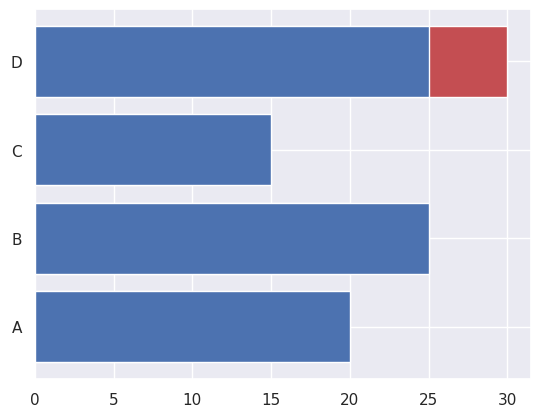

In [ ]:
# importing package
import matplotlib.pyplot as plt

# create data
x = ['A', 'B', 'C', 'D']
y1 = [10, 20, 10, 30]
y2 = [20, 25, 15, 25]

# plot bars in stack manner
plt.barh(x, y1, color='r')
plt.barh(x, y2, color='b')
plt.show()

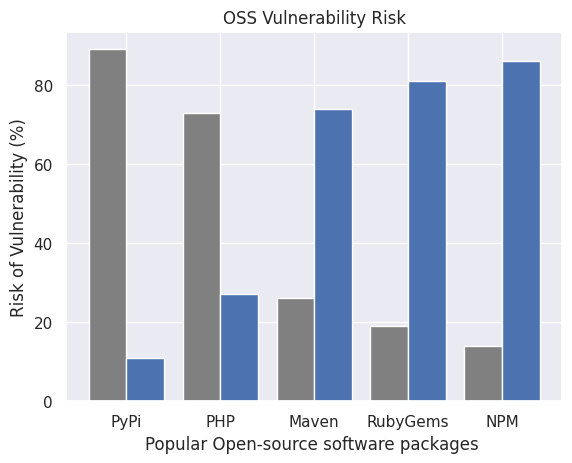

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


# species = (
#     "PyPi",
#     "PHP Packagist",
#     "Maven Central",
#     "RubyGems",
#     "NPM",
# )
# weight_counts = {
#     "Direct": np.array([89, 73, 26, 19, 14]),
#     "Indirect": np.array([11, 27, 74, 81, 86]),
# }
# width = 0.5

X = ['PyPi','PHP','Maven','RubyGems','NPM']
Ygirls = [89, 73, 26, 19, 14]
Zboys = [11, 27, 74, 81, 86]

X_axis = np.arange(len(X))

plt.bar(X_axis - 0.2, Ygirls, width = 0.4, label = 'Direct', color='gray')
plt.bar(X_axis + 0.2, Zboys, width = 0.4, label = 'Indirect', color='b')

plt.xticks(X_axis, X)
plt.xlabel("Popular Open-source software packages ")
plt.ylabel("Risk of Vulnerability (%)")
plt.title("OSS Vulnerability Risk")


# top_bar = mpatches.Patch(color='darkblue', label='smoker = No')
# bottom_bar = mpatches.Patch(color='lightblue', label='smoker = Yes')
# plt.legend(handles=[top_bar, bottom_bar])


plt.show()

In [ ]:
!pip install -U kaleid

ERROR: Could not find a version that satisfies the requirement kaleid (from versions: none)
ERROR: No matching distribution found for kaleid


In [ ]:
import plotly.express as px
import pandas as pd

# Sample data
df = pd.DataFrame(dict(
    stage = ['PyPi','PHP','Maven','RubyGems','NPM',
             'PyPi','PHP','Maven','RubyGems','NPM'],
    percentage = [89, 73, 26, 19, 14,
                  11, 27, 74, 81, 86],
    campaign = ['Direct', 'Direct', 'Direct', 'Direct','Direct'
                'Indirect', 'Indirect', 'Indirect', 'Indirect','Indirect']))

# X = ['PyPi','PHP','Maven','RubyGems','NPM']
# Ygirls = [89, 73, 26, 19, 14]
# Zboys = [11, 27, 74, 81, 86]


fig = px.funnel(df, x = 'percentage', y = 'stage', color = 'campaign',
                color_discrete_map = {'Direct': 'blue', 'Indirect': 'red'})
fig.update_traces(textfont = {'color': 'white'})

fig.show()


ValueError: ignored

In [ ]:
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.2 MB/s eta 0:00:00


In [ ]:
import plotly
import plotly.express as px
import kaleido
import pandas as pd

# Sample data
df = pd.DataFrame(dict(
    Packages = ['PyPi','PHP','Maven','RubyGems','NPM',
             'PyPi','PHP','Maven','RubyGems','NPM'],
    percentage = [89, 73, 26, 19, 14,
                  11, 27, 74, 81, 86],
    Dependency = ['Direct', 'Direct', 'Direct', 'Direct','Direct',
                'Indirect', 'Indirect', 'Indirect', 'Indirect','Indirect']))

fig = px.funnel(df, x = 'percentage', y = 'Packages', color = 'Dependency',
                color_discrete_map = {'Direct': '#CBC3E3', 'Indirect': 'gray'})
fig.update_traces(textfont = {'color': 'black'})

plotly.offline.plot(fig, filename='lifeExp.png')
fig.show()



/usr/local/lib/python3.10/dist-packages/plotly/offline/offline.py:562: UserWarning:

Your filename `lifeExp.png` didn't end with .html. Adding .html to the end of your file.



<ipython-input-20-47c71e4453fc>:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['%.2f' %i for i in newvals])


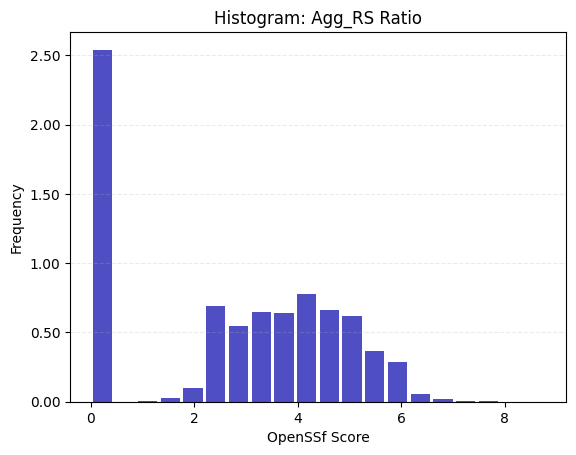

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df11 = pd.read_csv('openssf-latest.csv')
df1 = df11.sort_values(by='Overall', ascending=False)

#df1 = df12[df12['FinalRiskScore'] < .5]

# df2 = df1.loc[(df1['Agg_RS)']>=40) & (df1['FinalRiskScore']>= 0.20),
#                     ['Id','Label', 'FinalRiskScore','Agg_RS)','Agg_RS20)','Agg_RS30)','Agg_RS50)']]

x_axis = df1['Overall'].dropna()

f, ax = plt.subplots(1, 1)

n, bins, patches = plt.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

vals = ax.get_yticks()
newvals = vals/1000
ax.set_yticklabels(['%.2f' %i for i in newvals])


plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
# plt.grid(axis='x', alpha=0.75)
#plt.ylim(0, 1)
plt.xlabel('OpenSSf Score')
plt.ylabel('Frequency')
plt.title('Histogram: Agg_RS Ratio')
plt.savefig('OpenSSF-Scorecard1.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()


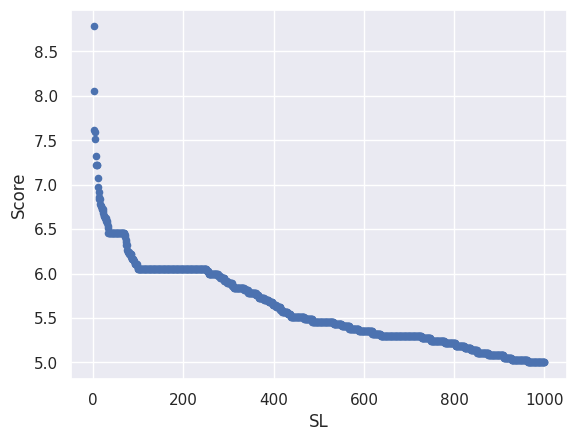

In [ ]:
# Program to draw scatter plot using Dataframe.plot
# Import libraries
import pandas as pd

# Prepare data
data= pd.read_csv('Openssf-score.csv')

# Load data into DataFrame
df = pd.DataFrame(data = data);

# Draw a scatter plot
df.plot.scatter(x = 'SL', y = 'Score');

<ipython-input-25-a1285ad81991>:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['%.2f' %i for i in newvals])


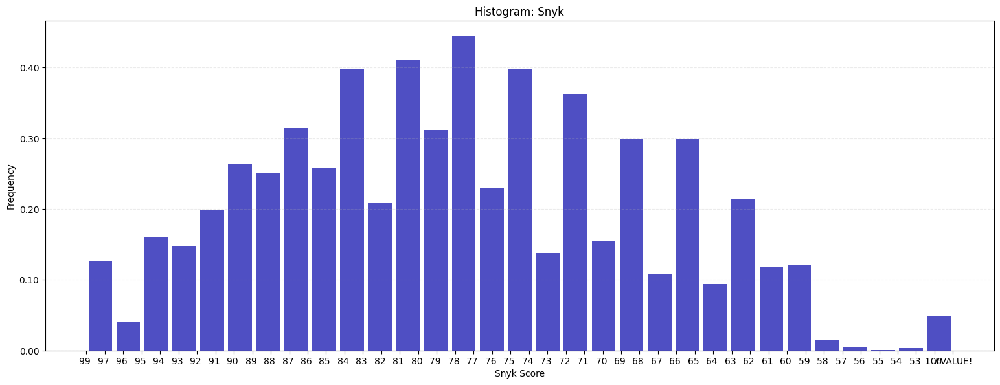

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df11 = pd.read_csv('output1.csv')
df1 = df11.sort_values(by='Finalscore', ascending=False)

#df1 = df12[df12['FinalRiskScore'] < .5]

# df2 = df1.loc[(df1['Agg_RS)']>=40) & (df1['FinalRiskScore']>= 0.20),
#                     ['Id','Label', 'FinalRiskScore','Agg_RS)','Agg_RS20)','Agg_RS30)','Agg_RS50)']]

x_axis = df1['Finalscore'].dropna()

f, ax = plt.subplots(1, 1, figsize=(18.90,6.62))

n, bins, patches = plt.hist(x=x_axis, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

vals = ax.get_yticks()
newvals = vals/1000
ax.set_yticklabels(['%.2f' %i for i in newvals])


plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
# plt.grid(axis='x', alpha=0.75)
#plt.ylim(0, 1)
plt.xlabel('Snyk Score')
plt.ylabel('Frequency')
plt.title('Histogram: Snyk')
plt.savefig('newHist_high_low11.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)
plt.show()


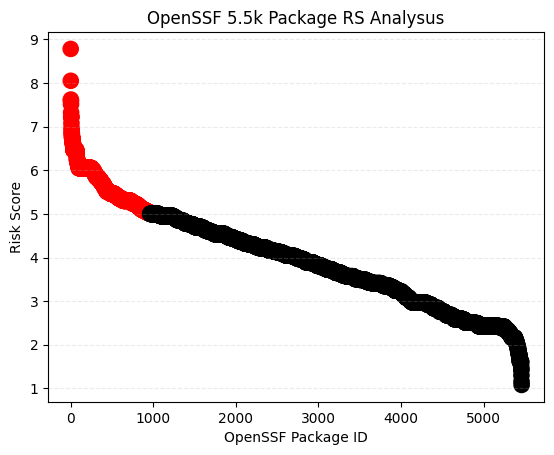

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df11 = pd.read_csv('test1.csv')
#df1 = df11.sort_values(by='Overall', ascending=False)

# y_axis = df1['Overall'].dropna()

colors = np.where(df11['Overall'] > 5, 'r', 'k')
plt.scatter(df11['SL'], df11['Overall'], s=120, c=colors)

#df = df11.reset_index()

#df11.plot(kind='scatter', x='SL', y='Overall', s=120)

plt.grid(axis='y', alpha=0.25, zorder=0, linestyle = '--')
# plt.grid(axis='x', alpha=0.75)
#plt.ylim(0, 1)
plt.xlabel('OpenSSF Package ID')
plt.ylabel('Risk Score')
plt.title('OpenSSF 5.5k Package RS Analysus')
plt.savefig('OpenSSF-Scatter.png', dpi=1200, facecolor='w', edgecolor='b',transparent=True)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

#figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df11 = pd.read_csv('output1.csv')

df11

FileNotFoundError: ignored

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import statistics
import pandas as pd

df3 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df4 = df3.sort_values(by='FinalRiskScore', ascending=False)
#df5 = df3.sort_values(by='Outgoing Risk (Inreach)', ascending=False)

x_axis = df4['FinalRiskScore'].dropna()
#x_axis1 = df5['Outgoing Risk (Inreach)'].dropna()/df5['Outgoing Risk (Inreach)'].max()

mean = statistics.mean(x_axis)
sd = statistics.stdev(x_axis)

plt.plot(x_axis1, norm.pdf(x_axis1, mean, sd))
#plt.plot(x_axis1, norm.pdf(x_axis1, mean1, sd1))
plt.show()

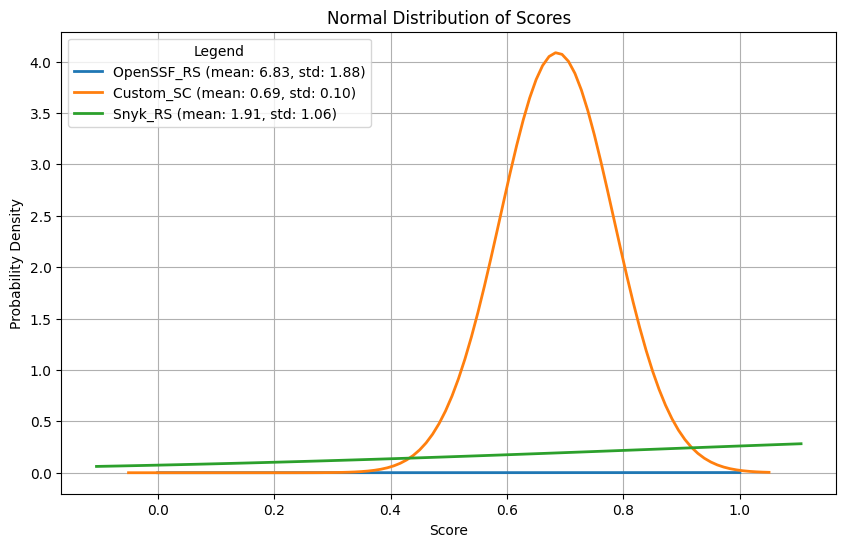

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Define the URL where the CSV is located
url = 'https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Merge-Datasets-main/merged_file_2.csv'

# Read the CSV from the URL
df = pd.read_csv(url)

# Extract the relevant columns for comparison
columns_to_plot = ['OpenSSF_RS', 'Custom_SC', 'Snyk_RS']
data_to_plot = df[columns_to_plot].dropna()  # Drop rows with NaN values

# Plot the normal distribution curves
plt.figure(figsize=(10, 6))

for column in columns_to_plot:
    # Calculate the mean and standard deviation of each column
    mu, std = norm.fit(data_to_plot[column])

    # Plot the distribution curve
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, lw=2, label=f'{column} (mean: {mu:.2f}, std: {std:.2f})')

plt.title('Normal Distribution of Scores')
plt.xlabel('Score')
plt.ylabel('Probability Density')
plt.legend(title='Legend')
plt.grid(True)
plt.show()


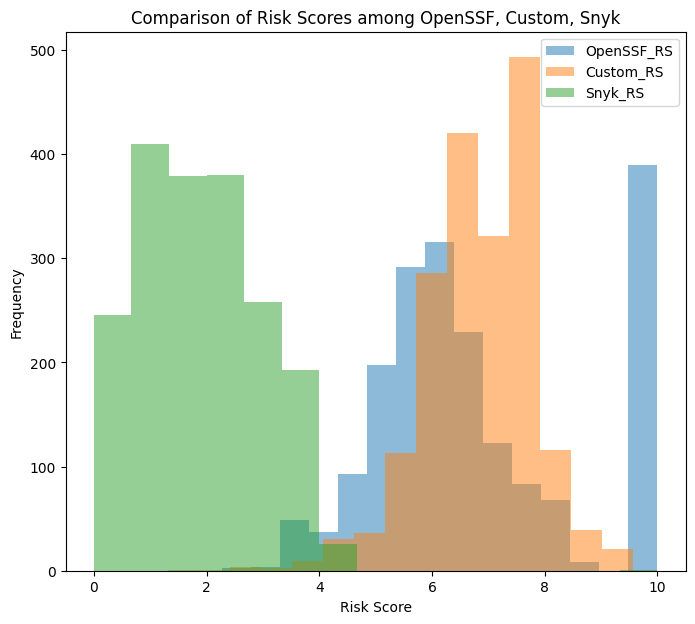

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the CSV file
file_path = 'https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Merge-Datasets-main/merged_file_2.csv'
df = pd.read_csv(file_path)

# Extract data for the histograms
openSSF_RS = df['OpenSSF_RS']
custom_RS = df['Custom_RS']
snyk_RS = df['Snyk_RS']

# Plotting
plt.figure(figsize=(8, 7))

# Create histograms
plt.hist(openSSF_RS, bins=15, alpha=0.5, label='OpenSSF_RS')
plt.hist(custom_RS, bins=15, alpha=0.5, label='Custom_RS')
plt.hist(snyk_RS, bins=15, alpha=0.5, label='Snyk_RS')

# Adding labels and title
plt.xlabel('Risk Score')
plt.ylabel('Frequency')
plt.title('Comparison of Risk Scores among OpenSSF, Custom, Snyk')
plt.legend()
plt.savefig('comparison.pdf')
# Display the plot
plt.show()


<ipython-input-59-d3942bbea7ae>:28: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, zorder=4,  color='brown')
<ipython-input-59-d3942bbea7ae>:36: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, zorder=5, color='purple')
<ipython-input-59-d3942bbea7ae>:44: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, zorder=6, color='grey')


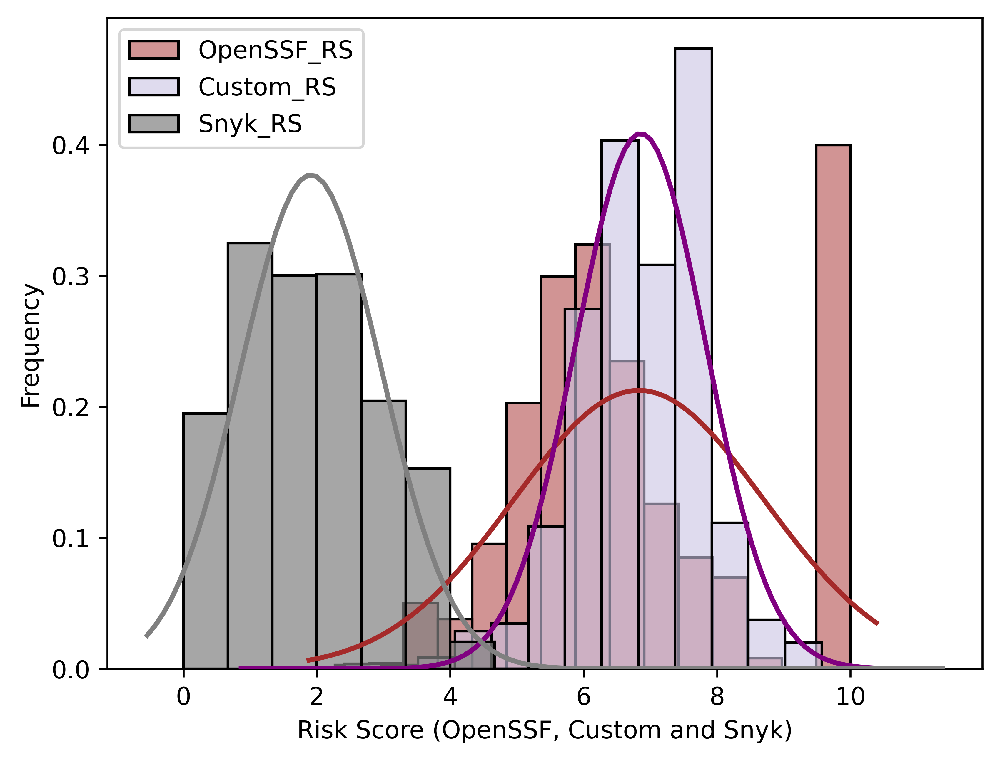

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import norm

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

# Load the CSV file
file_path = 'https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Merge-Datasets-main/merged_file_2.csv'
df = pd.read_csv(file_path)

# Extract data for the histograms
openSSF_RS = df['OpenSSF_RS']
custom_RS = df['Custom_RS']
snyk_RS = df['Snyk_RS']

# Plotting
#plt.figure(figsize=(9, 8))

# Histogram and normal distribution for OpenSSF_RS
sns.histplot(openSSF_RS, bins=15, alpha=0.5, kde=False, zorder=1, label='OpenSSF_RS', color='brown', stat="density")
mu, std = norm.fit(openSSF_RS)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, zorder=4,  color='brown')

# Histogram and normal distribution for Custom_RS
sns.histplot(custom_RS, bins=15,alpha=0.6,  zorder=2, kde=False, label='Custom_RS', color='#CBC3E3', stat="density")
mu, std = norm.fit(custom_RS)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, zorder=5, color='purple')

# Histogram and normal distribution for Snyk_RS
sns.histplot(snyk_RS, bins=15, kde=False,alpha=0.7, zorder=3, label='Snyk_RS', color='grey', stat="density")
mu, std = norm.fit(snyk_RS)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, zorder=6, color='grey')

# Adding labels and title
plt.xlabel('Risk Score (OpenSSF, Custom and Snyk)')
plt.ylabel('Frequency')
#plt.title('')
plt.legend()
plt.savefig('comparison3.png')
# Display the plot
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import math

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')

#df1['Cat'] = np.where(df1['FinalRiskScore'] > 0.5,'red', 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3

full_green ='#2E7F18'
less_green = '#45731E'
Olive_green = '#675E24'
brown_chestnut = '#8D472B'
sweet_brown='#B13433'
full_red ='#C82538'

GREY50 = "#7F7F7F"

df1['Cat0'] = np.where(df1['Ag_vs_RS_ratio'] >= 200, full_red, np.where(df1['Ag_vs_RS_ratio'] >= 100, sweet_brown, np.where(df1['Ag_vs_RS_ratio'] >= 50, brown_chestnut, np.where(df1['Ag_vs_RS_ratio'] >= 15, Olive_green, np.where(df1['Ag_vs_RS_ratio'] >= 5, less_green, full_green)))))

# df1['Cat0'] = np.where(df1[col1] >=.5, np.where(df1[col2] >= 50, 'red', 'blue'), (np.where(df1[col2] >= 50, GREY50, 'green')))

plt.scatter(df1['FinalRiskScore'],df1['Ag_vs_RS_ratio'], c=df1['Cat0'], alpha=0.5)

plt.axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.scatter(df1['FinalRiskScore'], df1['Agg_RS50)'], c='grey', alpha=0.15)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('PyPi Package Risk Score (RS)')
plt.ylabel('Aggregate-risk-inflation (Agg_RS/RS)')

plt.savefig('Inflation1.png')
plt.show()

KeyError: ignored

<Figure size 3840x2880 with 0 Axes>

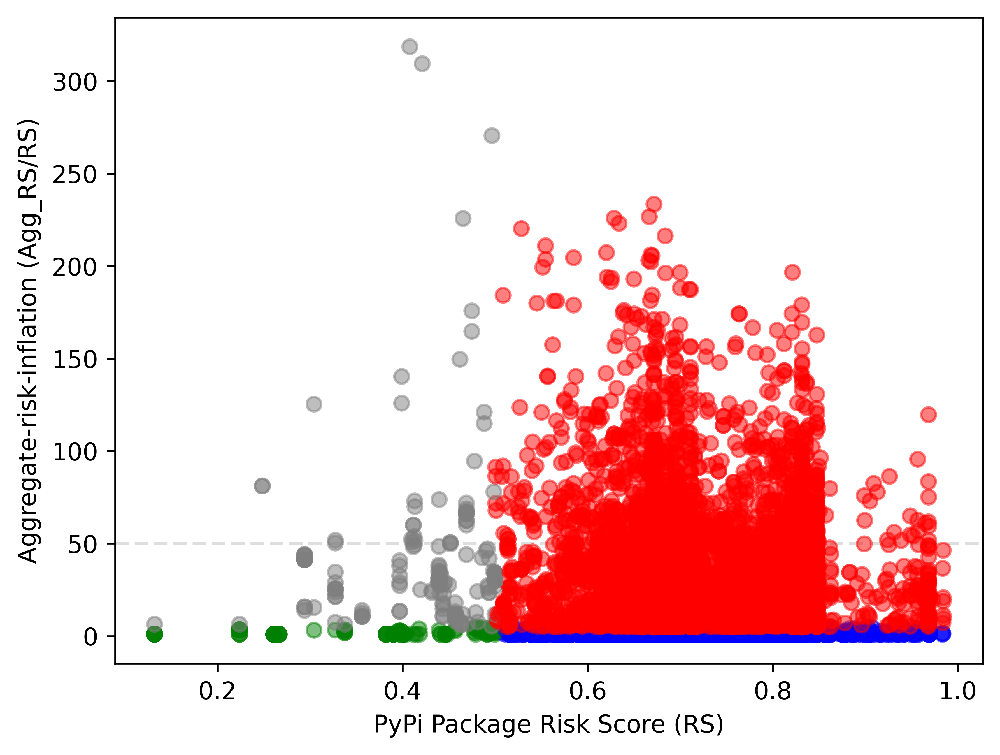

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import math

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/00_final-ratio-2.csv')
#df1 = pd.read_csv('/content/00_final-ratio-5.csv')

#df1['Cat'] = np.where(df1['FinalRiskScore'] > 0.5,'red', 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3

full_green ='#2E7F18'
less_green = '#45731E'
Olive_green = '#675E24'
brown_chestnut = '#8D472B'
sweet_brown='#B13433'
full_red ='#C82538'

GREY50 = "#7F7F7F"

#df1['Cat0'] = np.where(df1['Ag_vs_RS_ratio'] >= 200, full_red, np.where(df1['Ag_vs_RS_ratio'] >= 100, sweet_brown, np.where(df1['Ag_vs_RS_ratio'] >= 50, brown_chestnut, np.where(df1['Ag_vs_RS_ratio'] >= 15, Olive_green, np.where(df1['Ag_vs_RS_ratio'] >= 5, less_green, full_green)))))
# df1['Cat0'] = np.where(df1[col1] >=.5, (np.where(df1[col2] >= 50, 'red', 'blue')), (np.where(df1[col2] >= 50, GREY50, 'green')))

df1['Cat0'] = np.where(df1['FinalRiskScore'] >=.5, (np.where(df1['Ag_vs_RS_ratio'] >= 5, 'red', 'blue')), (np.where(df1['Ag_vs_RS_ratio'] >= 5, GREY50, 'green')))
# df1['Cat0'] = np.where(df1['FinalRiskScore']>=.5 and df1['Ag_vs_RS_ratio'] <5, full_red, 'green')

# df1['Cat0'] = np.where(df1[col1] >=.5, np.where(df1[col2] >= 50, 'red', 'blue'), (np.where(df1[col2] >= 50, GREY50, 'green')))

plt.scatter(df1['FinalRiskScore'],df1['Ag_vs_RS_ratio'], c=df1['Cat0'], alpha=0.5)

plt.axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.scatter(df1['FinalRiskScore'], df1['Agg_RS50)'], c='grey', alpha=0.15)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('PyPi Package Risk Score (RS)')
plt.ylabel('Aggregate-risk-inflation (Agg_RS/RS)')

plt.savefig('InflationTest_1.png')
plt.show()

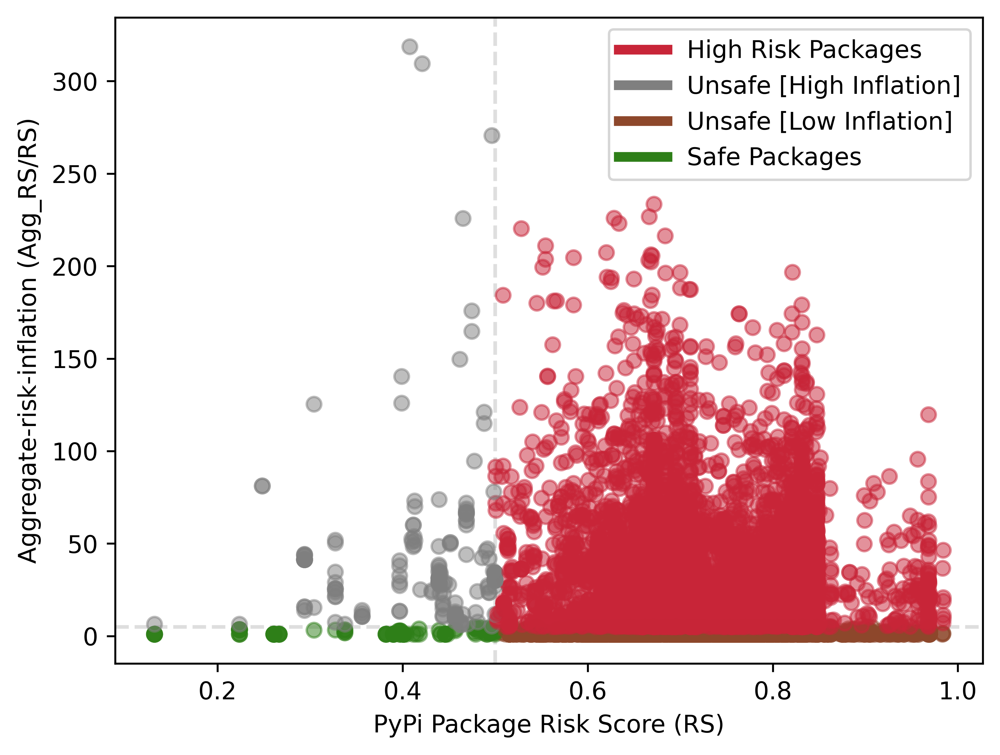

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

import math

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

#df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')
# file from raw is not working, please download and upload here
df1 = pd.read_csv('/content/00_final-ratio-3.csv')

#df1['Cat'] = np.where(df1['FinalRiskScore'] > 0.5,'red', 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3

full_green ='#2E7F18'
less_green = '#45731E'
Olive_green = '#675E24'
brown_chestnut = '#8D472B'
sweet_brown='#B13433'
full_red ='#C82538'

GREY50 = "#7F7F7F"

#df1['Cat0'] = np.where(df1['Ag_vs_RS_ratio'] >= 200, full_red, np.where(df1['Ag_vs_RS_ratio'] >= 100, sweet_brown, np.where(df1['Ag_vs_RS_ratio'] >= 50, brown_chestnut, np.where(df1['Ag_vs_RS_ratio'] >= 15, Olive_green, np.where(df1['Ag_vs_RS_ratio'] >= 5, less_green, full_green)))))
# df1['Cat0'] = np.where(df1[col1] >=.5, (np.where(df1[col2] >= 50, 'red', 'blue')), (np.where(df1[col2] >= 50, GREY50, 'green')))

df1['Cat0'] = np.where(df1['FinalRiskScore'] >=.5, (np.where(df1['Ag_vs_RS_ratio'] >= 5, full_red, brown_chestnut)), (np.where(df1['Ag_vs_RS_ratio'] >= 5, GREY50, full_green)))
#df1['Legend'] = np.where(df1['FinalRiskScore'] >=.5, (np.where(df1['Ag_vs_RS_ratio'] >= 5, 'Risky Packages', 'Risky Packages')), (np.where(df1['Ag_vs_RS_ratio'] >= 5, 'Risky Packages', 'Safe Packages')))
# df1['Cat0'] = np.where(df1['FinalRiskScore']>=.5 and df1['Ag_vs_RS_ratio'] <5, full_red, 'green')

# df1['Cat0'] = np.where(df1[col1] >=.5, np.where(df1[col2] >= 50, 'red', 'blue'), (np.where(df1[col2] >= 50, GREY50, 'green')))

plt.scatter(df1['FinalRiskScore'],df1['Ag_vs_RS_ratio'], c=df1['Cat0'], alpha=0.5)

# from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=full_red, lw=4), Line2D([0], [0], color=GREY50, lw=4), Line2D([0], [0], color=brown_chestnut, lw=4), Line2D([0], [0], color=full_green, lw=4)]
plt.legend(custom_lines, ['High Risk Packages', 'Unsafe [High Inflation]','Unsafe [Low Inflation]', 'Safe Packages'])

plt.axhline(y = 5, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.scatter(df1['FinalRiskScore'], df1['Agg_RS50)'], c='grey', alpha=0.15)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
#plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
#plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('PyPi Package Risk Score (RS)')
plt.ylabel('Aggregate-risk-inflation (Agg_RS/RS)')

plt.savefig('InflationTest_4.pdf')
plt.show()

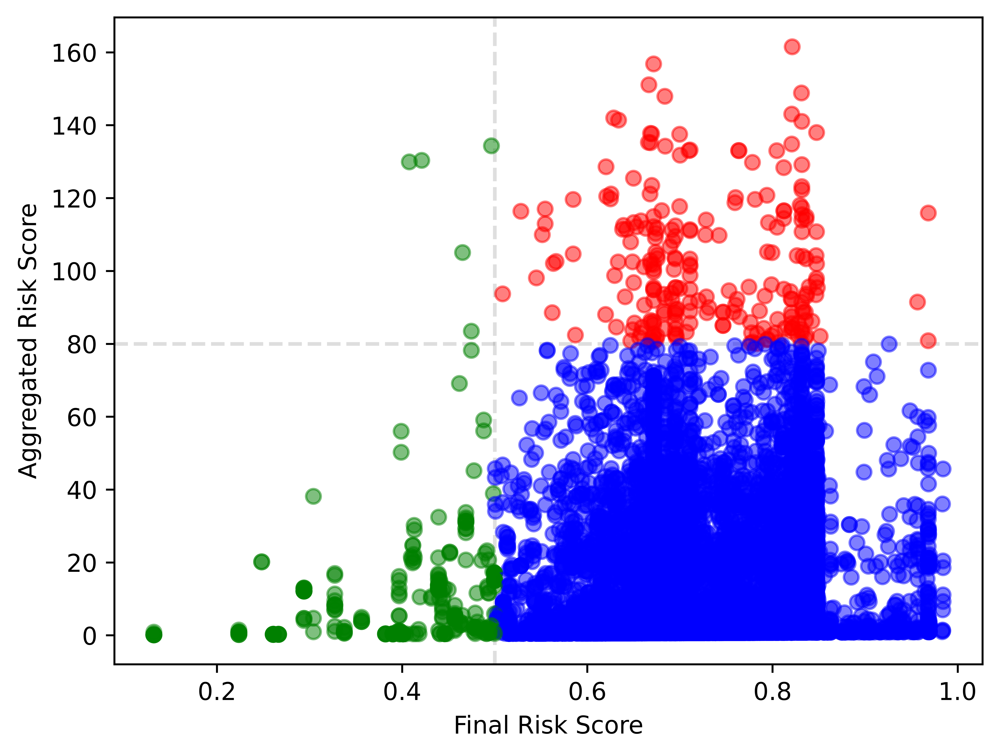

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
figure(num=None, dpi=1200, facecolor='w', edgecolor='b')

df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')

col1 = 'FinalRiskScore'
col2 = 'Outgoing Risk (Inreach)'

# conditions  = [ (df1[col1] >= .5 & df1[col2] >= 120), (df1[col1] >= .5 & df1[col2] < 120), (df1[col1] < .5 & df1[col2] >= 120), (df1[col1] < .5 & df1[col2] < 120) ]
# choices     = [ 'red', 'blue','yellow', 'green' ]



# df1['Cat'] = np.select(conditions, choices, default=np.nan)

df1['Cat'] = np.where(df1[col1] >=.5, (np.where(df1[col2] >= 80, 'red', 'blue')), 'green')
#df1['PR_Category'] = np.where(df1['Out_reach'] > 4200,'D', 'T')

#sizes = df1['Degree']/3


plt.scatter(df1['FinalRiskScore'], df1['Outgoing Risk (Inreach)'], c=df1['Cat'], alpha=0.5)
#[plt.text(x=row['FinalRiskScore'], y=row['Out_reach'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df1.iterrows() if 'D' in row.PR_Category]
plt.axvline(x = .5, color = GREY50, alpha=0.25, zorder=0, linestyle="--")
plt.axhline(y = 80, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('Final Risk Score')
plt.ylabel('Aggregated Risk Score')
plt.savefig('score-vs-ag_score-1.png')
plt.show()

<ipython-input-1-d0bfb2ff357e>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Cat1'] = np.where(df2['Outgoing Risk (Inreach)'] > 50, '#7F7F7F', 'green')


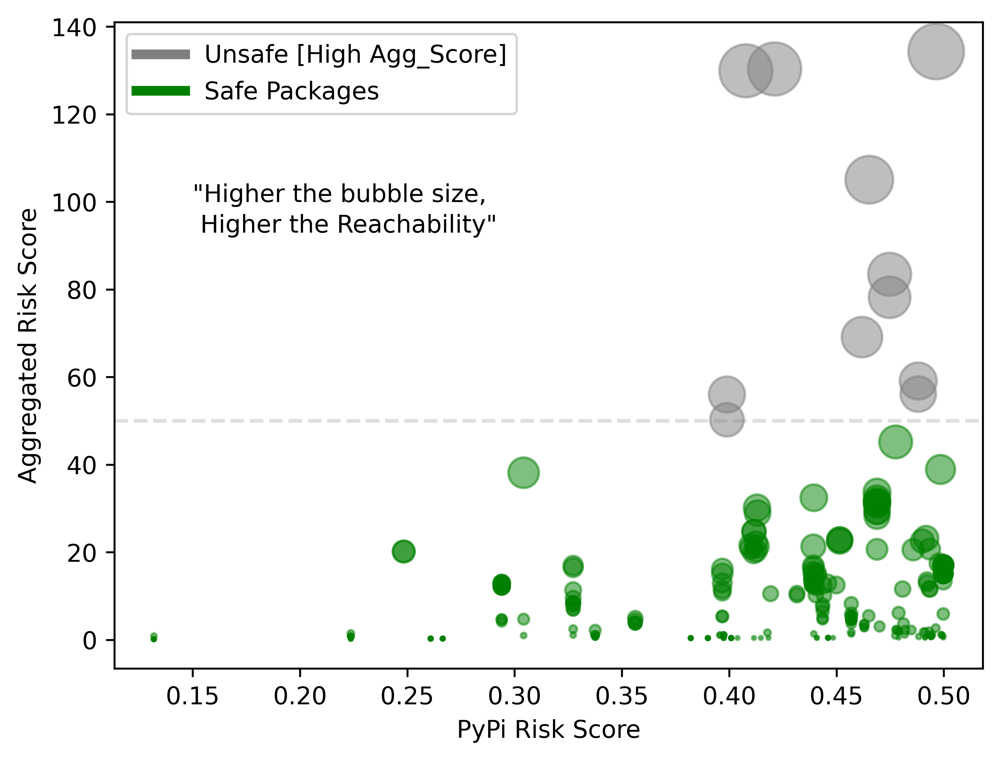

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from matplotlib.pyplot import figure
figure(num=None, dpi=600, facecolor='w', edgecolor='b')

df1 = pd.read_csv('https://raw.githubusercontent.com/rahmanziaur/TestGraphTheory/main/Reverse_Final_1.6.csv')

df2 = df1[df1['FinalRiskScore'] < .5]


GREY50 = "#7F7F7F"

df2['Cat1'] = np.where(df2['Outgoing Risk (Inreach)'] > 50, '#7F7F7F', 'green')
#df2['R_Category'] = np.where(df2['Outgoing Risk (Inreach)'] > 80,'D', 'T')

sizes = df2['In_reach']*2.5
#sizes_deg = sizes * df2['Degree'] /100

plt.scatter(df2['FinalRiskScore'], df2['Outgoing Risk (Inreach)'], s=sizes, c=df2['Cat1'], alpha=0.5)

custom_lines = [Line2D([0], [0], color=GREY50, lw=4), Line2D([0], [0], color='green', lw=4)]
plt.legend(custom_lines, ['Unsafe [High Agg_Score]', 'Safe Packages'])

#plt.scatter(df2['FinalRiskScore'], df2['Outgoing Risk (Inreach)'], s=sizes_deg, c='#7F7F7F')

#[plt.text(x=row['FinalRiskScore'], y=row['Outgoing Risk (Inreach)'], s="["+str(row['Id'])+"] : "+row['Label'].split('-')[0]+row['Label'].split('-')[1], fontsize=10) for k,row in df2.iterrows() if 'D' in row.R_Category]

plt.axhline(y = 50, color = GREY50, alpha=0.25, zorder=0, linestyle = '--')
plt.xlabel('PyPi Risk Score')
plt.ylabel('Aggregated Risk Score')
plt.text(0.15, 100, '"Higher the bubble size,')
plt.text(0.15, 93, ' Higher the Reachability"')
plt.savefig('low-score-vs-ag_score4.pdf')
plt.show()